In [419]:
# data, system tools
import pandas as pd
import numpy as np
import os
import glob
import itertools

# multiprocessing
import multiprocessing as mp
from functools import partial

# stats
from statsmodels.stats import outliers_influence
import statsmodels.stats.multitest as multi
import statsmodels.api as sm
import statsmodels.formula.api as smf
import statannot
import scipy
import scipy.stats
from scipy.stats import truncnorm

# R
import rpy2.robjects as ro
from rpy2.robjects.packages import importr
from rpy2.robjects import pandas2ri
pandas2ri.activate()
bayesfactor = importr('BayesFactor')     # ToDo: get this to work again

# Meshes
from skimage import measure
import nibabel as nib
from copy import deepcopy
import re
import numpy as np

# plotting
import seaborn as sns
import matplotlib as mpl
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.backends.backend_pdf import PdfPages
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from matplotlib.colors import LightSource
%matplotlib inline

# colors
prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']

## Writing, loading

In [420]:
def write_obj(fn, verts, faces, normals):
    faces += 1  # 1-based
    with open(fn, 'w') as f:
        for item in verts:
            f.write("v {0} {1} {2}\n".format(item[0],item[1],item[2]))

        for item in normals:
            f.write("vn {0} {1} {2}\n".format(item[0],item[1],item[2]))

        for item in faces:
            f.write("f {0}//{0} {1}//{1} {2}//{2}\n".format(item[0],item[1],item[2]))  

        f.close()

def read_obj(fn):
    import re
    faces_regex = re.compile('f (?P<a>\d+)//(?P<b>\d+) (?P<c>\d+)//(?P<d>\d+) (?P<e>\d+)//(?P<f>\d+)\n')
    faces = []
    normals = []
    verts = []
    with open(fn, 'r') as f:
        obj_file = f.readlines()
        for line in obj_file:
            if line[0:2] == 'vn':
                normals.append(np.array([float(x) for x in line.split(' ')[1:]]))
            elif line[0] == 'v':
                verts.append(np.array([float(x) for x in line.split(' ')[1:]]))
            elif line[0] == 'f':
                if '//' in line:
                    gd = faces_regex.match(line)
                    faces.append(np.array([int(gd['a'])-1, int(gd['c'])-1, int(gd['e'])-1]))
                else:
                    faces.append(np.array([float(x) for x in line.split(' ')[1:]])-1)
                
    verts = np.array(verts)
    normals = np.array(normals)
    faces = np.array(faces)
    return verts, faces, normals

## Generate all meshes

In [158]:
all_masks_fns = sorted(glob.glob('/home/pilou/Projects/Ahead-Database/Automated-Parcellation/atlas_maps/*avg*.gz'))
all_masks_fns = [x for x in all_masks_fns if not 'background' in x and not 'bestlabel' in x and not 'maxlabel' in x and not 'maxproba' in x]
all_masks_fns[:5]

['/home/pilou/Projects/Ahead-Database/Automated-Parcellation/atlas_maps/ahead31_avg-amg_hem-l_skel_n105.nii.gz',
 '/home/pilou/Projects/Ahead-Database/Automated-Parcellation/atlas_maps/ahead31_avg-amg_hem-r_skel_n105.nii.gz',
 '/home/pilou/Projects/Ahead-Database/Automated-Parcellation/atlas_maps/ahead31_avg-cl_hem-l_skel_n105.nii.gz',
 '/home/pilou/Projects/Ahead-Database/Automated-Parcellation/atlas_maps/ahead31_avg-cl_hem-r_skel_n105.nii.gz',
 '/home/pilou/Projects/Ahead-Database/Automated-Parcellation/atlas_maps/ahead31_avg-fx_hem-lr_skel_n105.nii.gz']

In [159]:
regex = re.compile('.*ahead31_avg-(?P<roi>\S+)_hem-(?P<hemisphere>\S+)_skel_n105.ni*')
all_meshes_data = {}

for fn in all_masks_fns:
    #
    roi_name = regex.match(fn).groupdict()['roi']
    hemisphere = regex.match(fn).groupdict()['hemisphere']
    mask_name = regex.match(fn).groupdict()['roi'] + regex.match(fn).groupdict()['hemisphere']
    
    if roi_name == 'gpe':
        roi_name = 'GPe'
    elif roi_name == 'gpi':
        roi_name = 'GPi'
    elif mask_name == 'vent3':
        roi_name = '3V'
    elif mask_name == 'vent4':
        roi_name = '4V'
    elif mask_name == 'ventr' or mask_name == 'ventl':
        roi_name = 'LV'
    elif roi_name == 'fx':
        roi_name = 'fx'
    elif roi_name == 'ic':
        roi_name = 'ic'
    else:
        roi_name = roi_name.upper()
    print(f'{roi_name}... ', end='')

    # data
    raw_data = nib.load(fn).get_fdata()
    
    marchCubeSpace = 1.0 / 50.0
    verts, faces, normals, values = measure.marching_cubes(raw_data, 0.5, spacing=(marchCubeSpace, marchCubeSpace, marchCubeSpace))
    all_meshes_data[roi_name + '-' + hemisphere] = {'verts': verts, 'faces': faces, 'normals': normals, 'values': values}
    
    save_fn = f'./objs/{roi_name}-{hemisphere}.obj'
    if not os.path.exists(os.path.dirname(save_fn)):
        os.makedirs(os.path.dirname(save_fn))
    write_obj(save_fn, verts, faces, normals)

AMG... AMG... CL... CL... fx... GPe... GPe... GPi... GPi... ic... ic... PAG... PAG... PPN... PPN... RN... RN... SN... SN... STN... STN... STR... STR... THA... THA... 3V... 4V... LV... LV... VTA... VTA... 

# Load meshes

In [421]:
mesh_obj_dir = './objs'
objs = sorted(glob.glob(os.path.join(mesh_obj_dir, '*.obj')))
structs = {}
for obj in objs:
    verts, faces, normals = read_obj(obj)
    name = os.path.basename(obj).split('.')[0].upper()
    name = name.replace('GPE', 'GPe').replace('GPI', 'GPi').replace('IC', 'ic').replace('FX-LR', 'fx').replace('VENT-3', '3V').replace('VENT-4', '4V').replace('VENT', 'LV')
    structs[name] = {'verts': verts, 'faces': faces, 'normals': normals}

# Load age models

In [422]:
model_dir = 'app/subcortex-app/data/winning_models/'
qmri_models = models = pd.read_pickle(os.path.join(model_dir, 'qmri_age_models.pkl'))
location_models = pd.read_pickle(os.path.join(model_dir, 'location_models_acrosshemispheres.pkl'))
location_models = location_models.rename(columns={'metric': 'qMRI'})   # for compatibility
models = pd.concat([qmri_models, location_models])

def get_location_shift(result, age, sex=0.5):
    location = result.predict(pd.DataFrame({'Age': age, 'Age2': age**2, 'sex': 0.5}, index=[0])).iloc[0]
    int_loc = result.predict(pd.DataFrame({'Age': 19, 'Age2': 19**2, 'sex': 0.5}, index=[0])).iloc[0]
    return location-int_loc

def get_prediction(result, age, sex=0.5):
    return result.predict(pd.DataFrame({'Age': age, 'Age2': age**2, 'sex': 0.5}, index=[0])).iloc[0]

In [335]:
def load_mpl_meshes(qMRI, structs, centralize=False):
    all_mpl_meshes = []
    
    ## Set vmax
    if qMRI == 'iron':
        vmax = 30
    else:
        vmax = 20
    vmin = 0

    # First run: just get all random intensities, required for normalizing
    all_intensities = np.array([])
    all_ranges = []
    for i, (roi_name, mesh_data) in enumerate(structs.items()):
#        print(f'{roi_name}... ', end='')

        if not roi_name == 'fx':
            roi_name, hemisphere = roi_name.split('-')
        else:
            roi_name = 'fx'
            hemisphere = 'lr'
        verts = mesh_data['verts']
        faces = mesh_data['faces']

        ## 
        for age in [19,75]:
            median_intensity = get_prediction(models.loc[(models.qMRI == qMRI) & (models.ROI == roi_name) & (models.Statistic == 'median'), 'result'].iloc[0], age=age)
            iqr_intensity = get_prediction(models.loc[(models.qMRI == qMRI) & (models.ROI == roi_name) & (models.Statistic == 'iqr'), 'result'].iloc[0], age=age)

            random_intensities = truncnorm.rvs(0, 35, loc=median_intensity, scale=iqr_intensity*1.349425*0.9, size=faces.shape[0])
            all_intensities = np.concatenate([all_intensities, random_intensities])
    
        # verts
        all_ranges.append([verts.min(0), verts.max(0)])
    
    # final ranges
    xyz_min = np.array(all_ranges).min(0)[0]
    xyz_max = np.array(all_ranges).max(0)[1]
    com = xyz_min+(xyz_max-xyz_min)/2
    
    norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax, clip=False)
    mapper = cm.ScalarMappable(norm=norm, cmap=cm.Blues)

    # Now actually create meshes
    for roi_name, mesh_data in structs.items():
        print(f'{roi_name}... ', end='')

        if not roi_name == 'fx':
            roi_name, hemisphere = roi_name.split('-')
        else:
            roi_name = 'fx'
            hemisphere = 'lr'
        verts = mesh_data['verts'].copy()
        faces = mesh_data['faces']
        normals = mesh_data['normals']
        
        # centralize
        if centralize:
            verts -= com

        # Create Ploy3D and set up a light source
        mesh = Poly3DCollection(verts[faces], alpha=1.0)
        if hemisphere == 'l':
            azdeg = 0
        else:
            azdeg = 180  # flip light source for right hemisphere

        ls = LightSource(azdeg=azdeg, altdeg=45.0)

        # First change - normals are per vertex, so I made it per face.
        normalsarray = np.array([np.array((np.sum(normals[face[:], 0]/3), np.sum(normals[face[:], 1]/3), 
                                           np.sum(normals[face[:], 2]/3))/np.sqrt(np.sum(normals[face[:], 0]/3)**2 + np.sum(normals[face[:], 1]/3)**2 + np.sum(normals[face[:], 2]/3)**2)) for face in faces])

        # Next this is more asthetic, but it prevents the shadows of the image being too dark. (linear interpolation to correct)
        min_ = np.min(ls.shade_normals(normalsarray, fraction=1.0)) # min shade value
        max_ = np.max(ls.shade_normals(normalsarray, fraction=1.0)) # max shade value
        diff = max_-min_
        newMin = 0 # 0.3
        newMax = 1 # 0.95
        newdiff = newMax-newMin

        ## loop over ages to generate two meshes with different face colors
        for age in [19,75]:
            median_intensity = get_prediction(models.loc[(models.qMRI == qMRI) & (models.ROI == roi_name) & (models.Statistic == 'median'), 'result'].iloc[0], age=age)
            iqr_intensity = get_prediction(models.loc[(models.qMRI == qMRI) & (models.ROI == roi_name) & (models.Statistic == 'iqr'), 'result'].iloc[0], age=age)

            # Color per face; generate some random intensities with (approx) correct median & IQR of observed intensities
            random_intensities = truncnorm.rvs(0, 35, loc=median_intensity, scale=iqr_intensity*1.349425*0.9, size=faces.shape[0])
            colourRGB = mapper.to_rgba(random_intensities)

            # The correct shading for shadows are now applied. Use the face normals and light orientation to generate a shading value and apply to the RGB colors for each face.
            rgbNew = colourRGB*(newMin + newdiff*((ls.shade_normals(normalsarray, fraction=1.0)[:,np.newaxis]-min_)/diff))

            # Apply color to face
            if age == 19:
                mesh.set_facecolor(rgbNew)
            elif age == 75:
                old_mesh = deepcopy(mesh)
                old_mesh.set_facecolor(rgbNew)

        all_mpl_meshes.append({'mesh':deepcopy(mesh), 'old_mesh':deepcopy(old_mesh), 'ranges': [verts.min(0), verts.max(0)], 'name': roi_name, 'hemisphere': hemisphere})
    return all_mpl_meshes, norm

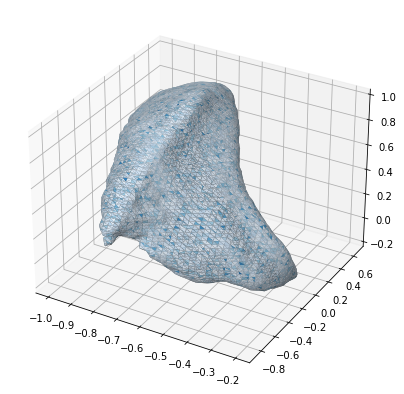

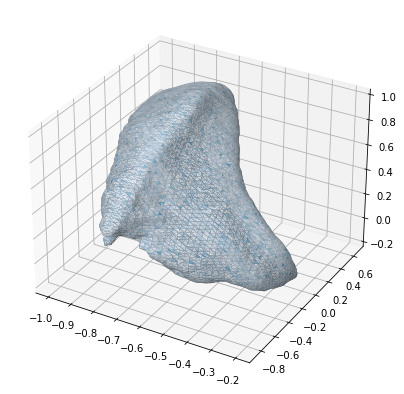

In [333]:
def plot_single_mesh(mesh, ranges):
    fig = plt.figure(figsize=(15, 15))
    ax = fig.add_subplot(1,2,1,projection='3d')
    ax.add_collection3d(deepcopy(mesh))
    ax.set_xlim([ranges[0][0],ranges[1][0]])
    ax.set_ylim([ranges[0][1],ranges[1][1]])
    ax.set_zlim([ranges[0][2],ranges[1][2]])
    
def plot_all_meshes(meshes, view_init_az=0, view_init_or=180):
    fig = plt.figure(figsize=(15, 15))
    ax = fig.add_subplot(1,1,1,projection='3d')
    
    all_ranges = []
    for mesh_info in meshes:
        mesh = mesh_info['mesh']
        ranges = mesh_info['ranges']
        ax.add_collection3d(deepcopy(mesh))
        all_ranges.append(ranges)

    ax.view_init(view_init_az,view_init_or)
    xyz_min = np.array(all_ranges).min(0)[0]
    xyz_max = np.array(all_ranges).max(0)[1]
    ax.set_xlim([xyz_min[0],xyz_max[0]])
    ax.set_ylim([xyz_min[1],xyz_max[1]])
    ax.set_zlim([xyz_min[2],xyz_max[2]])
    
to_plot = [x for x,i in enumerate(all_mpl_meshes) if i['name']=='ic'][0]
plot_single_mesh(all_mpl_meshes[to_plot]['old_mesh'], all_mpl_meshes[to_plot]['ranges'])
plot_single_mesh(all_mpl_meshes[to_plot]['mesh'], all_mpl_meshes[to_plot]['ranges'])

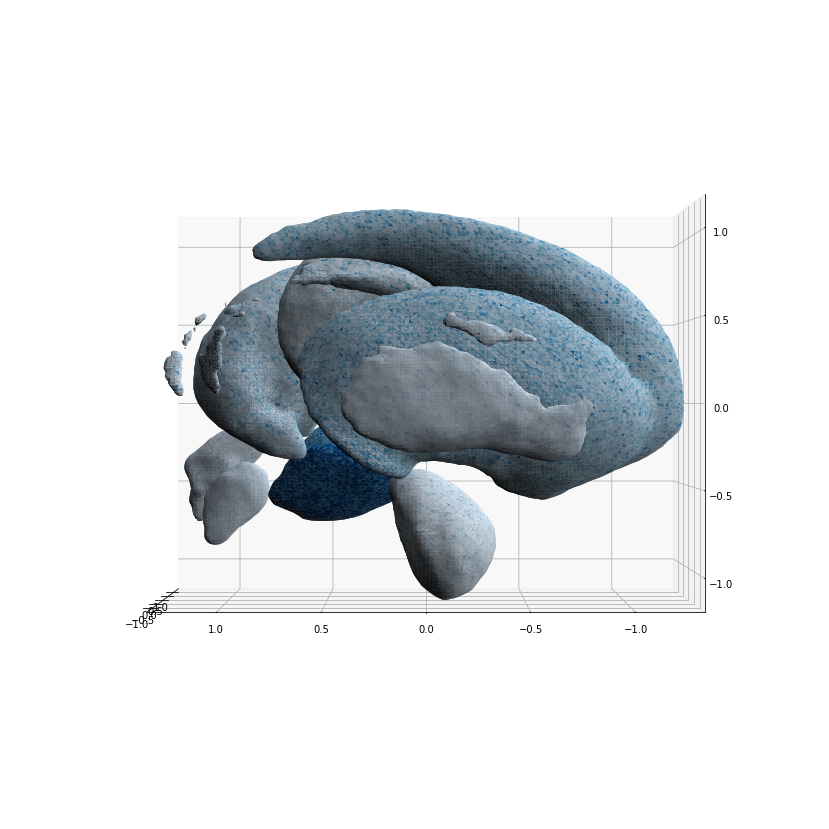

In [334]:
plot_all_meshes(all_mpl_meshes)

## Load data, clean

In [210]:
df = pd.read_pickle(os.path.join(model_dir, 'qMRI_data_collapsed.pkl'))
df['qMRI'] = df['Intensity']
df['Sex'] = df['sex'].map({0: 'Female', 1: 'Male'})
df = df.loc[df.Intensity != 'qpd']
## Remove Cortex, Cerebellum, save
df = df.loc[~df.ROI.isin(['Cerebellum', 'Cortex'])]
df = df[['Segmentation', 'ROI', 'Intensity', 'Statistic', 'Sex', 'Age',  'Value']]

# Prediction dfs
pred_dfM = pd.DataFrame({'Age': np.arange(19, 81),
                         'Age2': np.arange(19, 81)**2,
                         'sex': 1})
pred_dfF = pd.DataFrame({'Age': np.arange(19, 81),
                         'Age2': np.arange(19, 81)**2,
                         'sex': 0})

## Plot!

In [396]:
def plot_timespans_with_meshes(all_mpl_meshes, df, qMRI, total_changes_table, draft=False):
    # Plot a draft? if True, don't plot meshes
    # draft = False

    meshes_to_plot = pd.DataFrame(all_mpl_meshes)
#    meshes_to_plot = meshes_df.loc[(~meshes_df.name.isin(['3V', '4V', 'LV']))&(meshes_df.hemisphere.isin(['L', 'lr']))]
    meshes_to_plot['name_lowercase'] = meshes_to_plot['name'].apply(lambda x: x.lower())
    meshes_to_plot = meshes_to_plot.sort_values('name_lowercase')

    # Plot all, see if young -> old changes can be seen
    xwidth_cm = 30 ## this is way too wide for a4 but does give a nice figure when resized. 16 x 16 cm should fit on A4 (keeping margins in mind)
    fig = plt.figure(figsize=(xwidth_cm/2.54, xwidth_cm/2.54))
    gs = matplotlib.gridspec.GridSpec(4*3, # row for meshes, row for scatters, row empty 
                                      4*3, # two cols for meshes/scatters, one col empty 
                                      figure=fig, left=None, bottom=None, right=None, top=None, wspace=0, hspace=0, 
                                      width_ratios=[1,1,0.1] * 4, 
                                      height_ratios=[1,1,0.1] * 4)

    intensity = qMRI
    scatter_ylim = [df.loc[(df['Intensity'] == intensity),'Value'].min(),df.loc[(df['Intensity'] == intensity),'Value'].max()]
    for i,(idx,row_data) in enumerate(meshes_to_plot.iterrows()):
        col = (i+2)%4 * 3  # two rows per 'subplot', one empty. Shift by two for overall plots
        row = np.floor((i+2)/4).astype(int) * 3 # two columns per 'subplot', one empty

        # Meshes
        for ii, mesh_type in enumerate(['young_left', 'old_right']):
            if ii == 1:
                mesh = row_data['old_mesh']  # old, right
            else:
                mesh = row_data['mesh']     # young, left
            ranges = row_data['ranges']

            ax = fig.add_subplot(gs[row, col+ii], projection='3d')
            if not draft:
                ax.add_collection3d(deepcopy(mesh))
            ax.set_xlim([ranges[0][0], ranges[1][0]])
            ax.set_ylim([ranges[0][1], ranges[1][1]])
            ax.set_zlim([ranges[0][2], ranges[1][2]])
            if not draft:
                ax.axis('off')
            ax.set_box_aspect(aspect=(1,1,1),zoom=1.2)
    #         if ii == 1:
    #             ax.view_init(20, 180)
    #         else:
            ax.view_init(30, 30)
            if ii == 0:
                print('.', end='')
#                 print('{}: ax.azim {}, ax.elev {}'.format(row_data['name'] + '-' + row_data['hemisphere'], ax.azim, ax.elev))
                ax.set_title('19y', loc='left', y=.1, fontdict={'fontsize': 10}, bbox=dict(facecolor='white', alpha=0.75, edgecolor='white', pad=1))
            else:
                ax.set_title('75y', loc='right', y=.1, fontdict={'fontsize': 10}, bbox=dict(facecolor='white', alpha=0.75, edgecolor='white', pad=1))

        ax = fig.add_subplot(gs[slice(row, row+3), slice(col, col+2)])
        roi_name = row_data['name']
        if roi_name in ['fx', 'ic']:
            roi_name = '$\it{' + roi_name + '}$'
        ax.set_title(roi_name, y=.9)
        ax.axis('off')

        # scatterplots
        for ii, statistic in enumerate(['median', 'iqr']):
            ax = fig.add_subplot(gs[row+1,col+ii])
            data_ = df.loc[(df['ROI']==row_data['name']) & (df['Intensity'] == intensity) & (df['Statistic'] == statistic)]
            ax.grid(linestyle='--', color='lightgrey')
            ax.scatter(data_.Age, data_.Value, s=1, color=colors[0])
            ax.set_ylim(scatter_ylim)
            if row/3 < 3:
                ax.set_xticklabels([])
            # model
            result_ = models.loc[(models.ROI == row_data['name']) & (models.qMRI == intensity) & (models.Statistic == statistic), 'result'].iloc[0]
            pred1 = result_.predict(pred_dfM)
            pred2 = result_.predict(pred_dfF)
            if (pred1 == pred2).all():
                ax.plot(np.arange(19,81), pred1, 'k')
            else:
                ax.plot(np.arange(19,81), pred1, 'red')
                ax.plot(np.arange(19,81), pred2, 'green')
            ax.set_yticks([0,10,20])
            if col > 0 or ii == 1:
                ax.set_yticklabels([])
            title_text = ' Med.' if statistic == 'median' else ' IQR'
            if data_.Value.mean() > 10:
                title_y_pos = 0.05
            else:
                title_y_pos = 0.8
                
            total_change = total_changes_table.loc[row_data['name'], (qMRI, statistic)]
            title_text += ': ' + str(total_change.round(2))
            ax.set_title(title_text, y=title_y_pos, loc='left', fontdict={'fontsize': 10})

    # complete subcortex?
    # create new subgridspec
    gs00 = gs[:2,:6].subgridspec(3, 4, wspace=0, hspace=0, width_ratios=[.03, 1, 1, .1], height_ratios=[1, 1, .1])
    #gs01 = gs[1].subgridspec(3, 2)
    for ii, (az, orientation) in enumerate([(0,180), (0,0)]):
    #     ax = fig.add_subplot(gs[:2,(ii*3):(ii*3+2)], projection='3d')
        ax = fig.add_subplot(gs00[:2,ii+1], projection='3d')
        all_ranges = []
        for i,(idx,row_data) in enumerate(meshes_to_plot.iterrows()):
            print('.', end='')
            mesh = row_data['mesh']     # young, left
            all_ranges.append(row_data['ranges'])
            if not draft:
                tmp = ax.add_collection3d(deepcopy(mesh))
            else:
                if i == 0:
                    ax.add_collection3d(deepcopy(mesh))

        ax.view_init(az,orientation)
        ax.set_box_aspect(aspect=(1,1,1),zoom=1.2)
        xyz_min = np.array(all_ranges).min(0)[0]
        xyz_max = np.array(all_ranges).max(0)[1]
    #    print(xyz_min)
    #    print(xyz_max)
        ax.set_xlim([xyz_min[0],xyz_max[0]])
        ax.set_ylim([xyz_min[1],xyz_max[1]])
        ax.set_zlim([xyz_min[2],xyz_max[2]])
        if not draft:
            ax.axis('off')

    # Colorbar
    cbar_ax1 = fig.add_subplot(gs00[1,0])
    cb1 = mpl.colorbar.ColorbarBase(cbar_ax1, cmap=cm.Blues, norm=norm, ticklocation='left')
#    cb1.set_label('{} (ppm)'.format(qMRI.capitalize()))

    fig.text(0.5, 0.1, 'Age', ha='center')
    fig.text(0.08, 0.5, '{} (ppm)'.format(qMRI.capitalize()), va='center', rotation='vertical')

    sns.despine()
    
    return fig

In [386]:
final_table_absolute = pd.read_pickle('../data/interim_data/summary_table_qmri_absolute.pkl')

..........................................

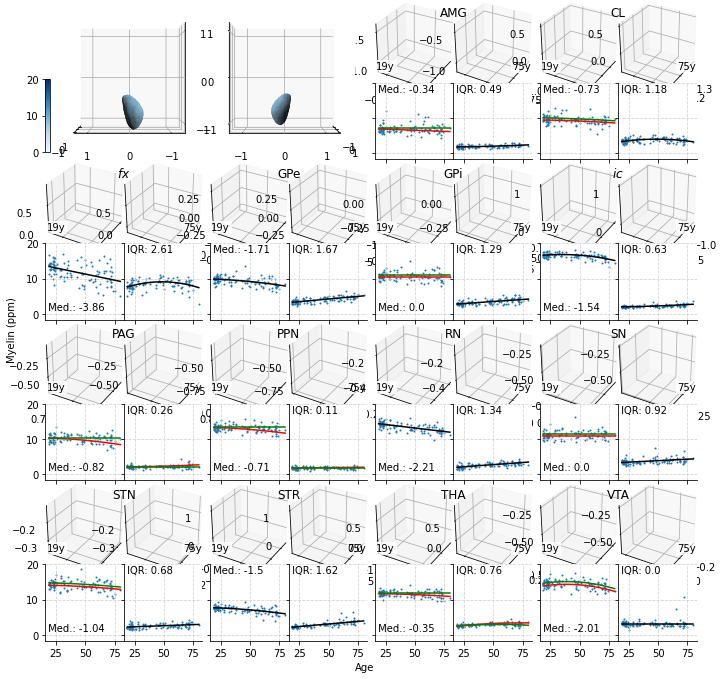

In [397]:
qMRI = 'myelin'

#structs_to_plot = {x:y for x,y in structs.items() if (x.endswith('L') or x == 'fx') and not x in ['LV-L', '3V-3', '4V-4']}
#all_mpl_meshes, norm = load_mpl_meshes(qMRI, structs_to_plot, centralize=True)

fig = plot_timespans_with_meshes(all_mpl_meshes, df, qMRI, total_changes_table=final_table_absolute, draft=True)

AMG-L... CL-L... GPe-L... GPi-L... PAG-L... PPN-L... RN-L... SN-L... STN-L... STR-L... THA-L... VTA-L... fx... ic-L... ..........................................AMG-L... CL-L... GPe-L... GPi-L... PAG-L... PPN-L... RN-L... SN-L... STN-L... STR-L... THA-L... VTA-L... fx... ic-L... ..........................................

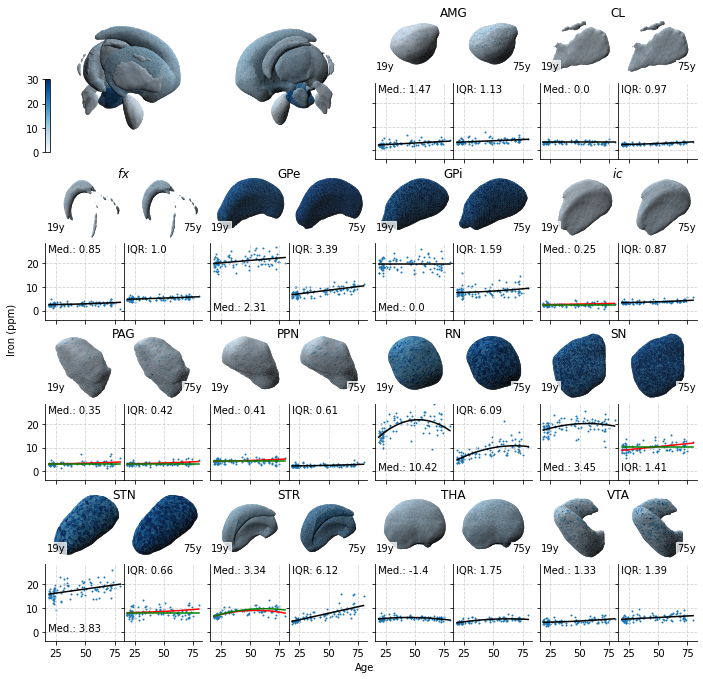

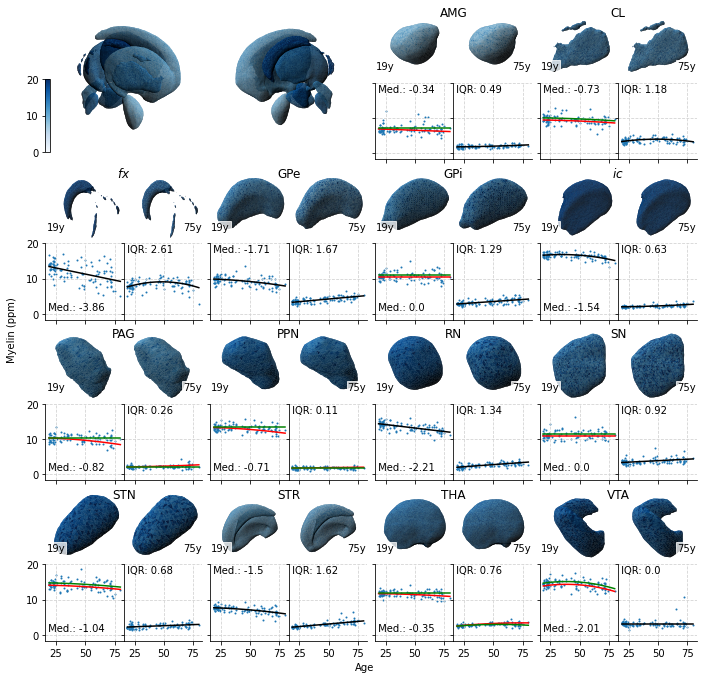

In [398]:
qMRI = 'iron'

for qMRI in ['iron', 'myelin']:
    structs_to_plot = {x:y for x,y in structs.items() if (x.endswith('L') or x == 'fx') and not x in ['LV-L', '3V-3', '4V-4']}
    all_mpl_meshes, norm = load_mpl_meshes(qMRI, structs_to_plot, centralize=True)

    fig = plot_timespans_with_meshes(all_mpl_meshes, df, qMRI, total_changes_table=final_table_absolute)
#     fig.savefig(f'./{qMRI}_timespan.pdf', bbox_inches='tight')
    fig.savefig(f'./{qMRI}_timespan.jpeg', dpi=250, bbox_inches='tight')

In [ ]:
## Ok, now thickness

In [399]:
## Location change

In [402]:
verts[:,0]

array([2.66662506, 2.66795074, 2.66795074, ..., 3.54889099, 3.54852112,
       3.54837341])

In [634]:
def load_mpl_location_meshes(structs, alphas=[0.5,0.5], azdeg=0, altdeg=0):
    all_mpl_meshes = []
    
    settings = {'AMG': {'color': 'red'},
            'CL': {'color': 'orange'},
            'fx': {'color': 'lightgrey'},
            'GPe': {'color': 'darkblue'},
            'GPi': {'color': 'lightblue'},
            'ic': {'color': 'darkorange'},
            'ICO': {'color': 'darkorange'},
            'PAG': {'color': 'grey'},
            'PPN': {'color': 'blue'},
            'RN': {'color': 'red'},
            'SCO': {'color': 'darkorange'},
            'SN': {'color': 'black'},
            'STN': {'color': 'purple'},
            'STR': {'color': 'lightgreen'},
            'THA': {'color': 'darkgreen'},
            'LV': {'color': 'white'},
            '3V': {'color': 'white'},
            '4V': {'color': 'white'},
            'VTA': {'color': 'forestgreen'},
           }

    # Now create meshes
    for roi_name, mesh_data in structs.items():
        print(f'{roi_name}... ', end='')

        if not roi_name == 'fx':
            roi_name, hemisphere = roi_name.split('-')
        else:
            roi_name = 'fx'
            hemisphere = 'lr'
        verts = mesh_data['verts'].copy()
        faces = mesh_data['faces']
        normals = mesh_data['normals']
        
        # Define lightsource
        ls = LightSource(azdeg=azdeg, altdeg=altdeg)

        # First change - normals are per vertex, so I made it per face.
        normalsarray = np.array([np.array((np.sum(normals[face[:], 0]/3), np.sum(normals[face[:], 1]/3), 
                                           np.sum(normals[face[:], 2]/3))/np.sqrt(np.sum(normals[face[:], 0]/3)**2 + np.sum(normals[face[:], 1]/3)**2 + np.sum(normals[face[:], 2]/3)**2)) for face in faces])

        # Next this is more asthetic, but it prevents the shadows of the image being too dark. (linear interpolation to correct)
        min_ = np.min(ls.shade_normals(normalsarray, fraction=1.0)) # min shade value
        max_ = np.max(ls.shade_normals(normalsarray, fraction=1.0)) # max shade value
        diff = max_-min_
        newMin = 0.3
        newMax = 0.95
        newdiff = newMax-newMin
        
        xyz_min = verts.min(0)
        xyz_max = verts.max(0)
        com = xyz_min+(xyz_max-xyz_min)/2

        ## loop over ages to generate two meshes with different face colors
        for age in [19,75]:
            verts = mesh_data['verts'].copy()  # copy verts, break pointer
            y_shift = get_location_shift(models.loc[(models.qMRI == 'location') & (models.ROI == roi_name) & (models.Statistic == 'Y_mni'), 'result'].iloc[0], age=age)/50*2   # marching cubes had 1/50 scaling based on 0.5mm data, models are in mm
            z_shift = get_location_shift(models.loc[(models.qMRI == 'location') & (models.ROI == roi_name) & (models.Statistic == 'Z_mni'), 'result'].iloc[0], age=age)/50*2
            x_shift = get_location_shift(models.loc[(models.qMRI == 'location') & (models.ROI == roi_name) & (models.Statistic == 'X_mni_abs'), 'result'].iloc[0], age=age)/50*2
#             print('{} {} {}...'.format(x_shift, y_shift, z_shift), end='')

            if not roi_name == 'fx':
                if hemisphere == 'L':
                    verts[:,0] -= x_shift   # nb: x-axis is flipped, so left is positive, right is negative (!) RAS # ToDO: DOUBLE CHECK THIS
                elif hemisphere == 'R':
                    verts[:,0] += x_shift
                verts[:,1] += y_shift
                verts[:,2] += z_shift
                
            # Create Ploy3D
#             if age == 19:
#                 alpha = alphas[0]
#             else:
#                 alpha = alphas[1]
            mesh = Poly3DCollection(verts[faces])
            
            # Using a constant color, put in desired RGB values here.
            colourRGB = np.array(matplotlib.colors.to_rgba(settings[roi_name]['color']))

            # The correct shading for shadows are now applied. Use the face normals and light orientation to generate a shading value and apply to the RGB colors for each face.
            rgbNew = colourRGB*(newMin + newdiff*((ls.shade_normals(normalsarray, fraction=1.0)[:,np.newaxis]-min_)/diff))

            # Apply color to face
            if age == 19:
                young_mesh = deepcopy(mesh)
                young_mesh.set_facecolor(rgbNew)
                young_mesh.set_alpha(alphas[0])
            elif age == 75:
                old_mesh = deepcopy(mesh)
                old_mesh.set_facecolor(rgbNew)
                old_mesh.set_alpha(alphas[1])

        all_mpl_meshes.append({'mesh':deepcopy(young_mesh),  # mesh at 19 yo
                               'old_mesh':deepcopy(old_mesh),  # mesh at 75 yo
                               'ranges': [verts.min(0), verts.max(0)], 
                               'name': roi_name, 
                               'hemisphere': hemisphere,
                               'com': com, # center of mass at 19 yo
                               'shifts': [x_shift, y_shift, z_shift], # shift in com between 19-75 yo
                               'color': np.array(matplotlib.colors.to_rgba(settings[roi_name]['color']))})
        
    return all_mpl_meshes, norm

In [639]:
all_mpl_meshes, norm = load_mpl_location_meshes(structs, alphas=[1,1])

#plot_all_meshes(all_mpl_meshes)

3V-3... 4V-4... AMG-L... AMG-R... CL-L... CL-R... GPe-L... GPe-R... GPi-L... GPi-R... LV-L... LV-R... PAG-L... PAG-R... PPN-L... PPN-R... RN-L... RN-R... SN-L... SN-R... STN-L... STN-R... STR-L... STR-R... THA-L... THA-R... VTA-L... VTA-R... fx... ic-L... ic-R... 

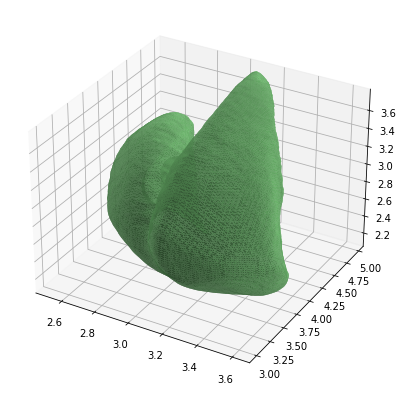

In [640]:
to_plot = [x for x,i in enumerate(all_mpl_meshes) if i['name']=='STR'][0]
plot_single_mesh(all_mpl_meshes[to_plot]['mesh'], all_mpl_meshes[to_plot]['ranges'])

## maybe arrows on transparant meshes?

In [592]:
from matplotlib.patches import FancyArrowPatch
from mpl_toolkits.mplot3d.proj3d import proj_transform
from mpl_toolkits.mplot3d.axes3d import Axes3D
class Arrow3D(FancyArrowPatch):

    def __init__(self, x, y, z, dx, dy, dz, *args, **kwargs):
        super().__init__((0, 0), (0, 0), *args, **kwargs)
        self._xyz = (x, y, z)
        self._dxdydz = (dx, dy, dz)

    def draw(self, renderer):
        x1, y1, z1 = self._xyz
        dx, dy, dz = self._dxdydz
        x2, y2, z2 = (x1 + dx, y1 + dy, z1 + dz)

        xs, ys, zs = proj_transform((x1, x2), (y1, y2), (z1, z2), self.axes.M)
        self.set_positions((xs[0], ys[0]), (xs[1], ys[1]))
        super().draw(renderer)
        
def _arrow3D(ax, x, y, z, dx, dy, dz, *args, **kwargs):
    '''Add an 3d arrow to an `Axes3D` instance.'''

    arrow = Arrow3D(x, y, z, dx, dy, dz, *args, **kwargs)
    ax.add_artist(arrow)


setattr(Axes3D, 'arrow3D', _arrow3D)

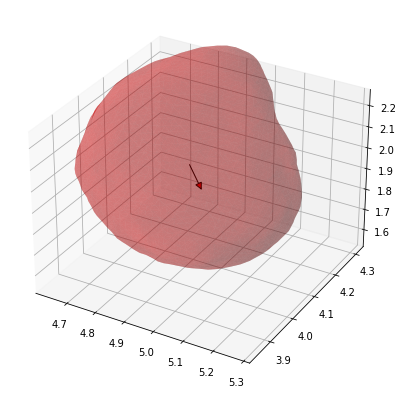

In [607]:
idx = 3
mesh, ranges, com, shifts, col = all_mpl_meshes[idx]['mesh'], all_mpl_meshes[idx]['ranges'], all_mpl_meshes[idx]['com'], all_mpl_meshes[idx]['shifts'].copy(), all_mpl_meshes[idx]['color']
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(1,2,1,projection='3d')
ax.add_collection3d(deepcopy(mesh))
ax.set_xlim([ranges[0][0],ranges[1][0]])
ax.set_ylim([ranges[0][1],ranges[1][1]])
ax.set_zlim([ranges[0][2],ranges[1][2]])
ax.arrow3D(com[0], com[1], com[2],
           shifts[0],shifts[1],shifts[2],
           mutation_scale=15,
           arrowstyle="-|>",
           linestyle='-',
           ec ='black',
           fc=col)

In [751]:
def plot_all_meshes_with_arrows(meshes, view_init_az=90, view_init_or=180, alpha=None, linewidth=None, zoom=1.3,
                                fig=None, ax=None, draft=False, mutation_scale_large=5, mutation_scale_small=3,
                                xyz_min=None, xyz_max=None):
    
    if fig is None:
        fig = plt.figure(figsize=(15, 15))
        ax = fig.add_subplot(1,1,1,projection='3d')
    
    all_ranges = []
    for mesh_info in meshes:
        mesh = mesh_info['mesh']
        ranges = mesh_info['ranges']
        if alpha is not None:
            mesh.set_alpha(alpha)
        
        if not draft:
            ax.add_collection3d(deepcopy(mesh))
        com = mesh_info['com']
        shifts = mesh_info['shifts'].copy() #?? required somehow
        if mesh_info['hemisphere'] == 'L':
            shifts[0] *= -1
            
        movement = np.sqrt(np.sum(np.array(shifts)**2))
        if movement < 0.1:
            mutation_scale = mutation_scale_small
        else:
            mutation_scale = mutation_scale_large
        
        if mesh_info['name'] != 'fx':
            ax.arrow3D(com[0], com[1], com[2],
                       shifts[0], shifts[1], shifts[2],
                       mutation_scale=mutation_scale,
                       arrowstyle="-|>",
                       linestyle='-',
                       linewidth=linewidth,
                       ec='k',
                       fc='k')

        all_ranges.append(ranges)
    
    ax.set_box_aspect(aspect=(1,1,1),zoom=zoom)
    ax.view_init(view_init_az,view_init_or)
    
    if xyz_min is None:
        xyz_min = np.array(all_ranges).min(0)[0]
        xyz_max = np.array(all_ranges).max(0)[1]
    
    ax.set_xlim([xyz_min[0],xyz_max[0]])
    ax.set_ylim([xyz_min[1],xyz_max[1]])
    ax.set_zlim([xyz_min[2],xyz_max[2]])
    if not draft:
        ax.axis('off')
    return xyz_min, xyz_max
# plot_all_meshes_young_and_old(all_mpl_meshes)

## Combine

In [722]:
settings = {'AMG': {'color': 'red'},
            'CL': {'color': 'orange'},
            'fx': {'color': 'lightgrey'},
            'GPe': {'color': 'darkblue'},
            'GPi': {'color': 'lightblue'},
            'ic': {'color': 'darkorange'},
#             'ICO': {'color': 'darkorange'},
            'PAG': {'color': 'grey'},
            'PPN': {'color': 'blue'},
            'RN': {'color': 'red'},
#             'SCO': {'color': 'darkorange'},
            'SN': {'color': 'black'},
            'STN': {'color': 'purple'},
            'STR': {'color': 'lightgreen'},
            'THA': {'color': 'darkgreen'},
            'LV': {'color': 'white'},
            '3V': {'color': 'white'},
            '4V': {'color': 'white'},
            'VTA': {'color': 'forestgreen'},
           }


3V-3... 4V-4... AMG-L... AMG-R... CL-L... CL-R... GPe-L... GPe-R... GPi-L... GPi-R... LV-L... LV-R... PAG-L... PAG-R... PPN-L... PPN-R... RN-L... RN-R... SN-L... SN-R... STN-L... STN-R... STR-L... STR-R... THA-L... THA-R... VTA-L... VTA-R... fx... ic-L... ic-R... 

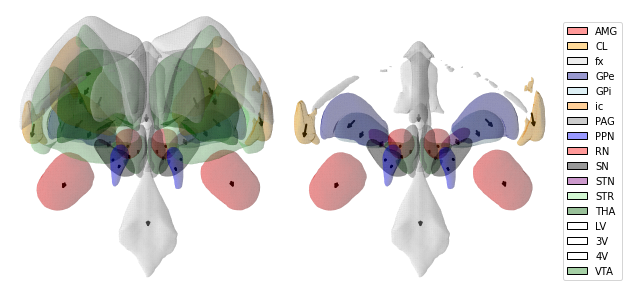

In [765]:
from matplotlib.patches import Patch
draft = False
fig = plt.figure(figsize=(9, 4.5))
gs = matplotlib.gridspec.GridSpec(1, 3, 
                                  figure=fig, left=None, bottom=None, right=None, top=None, 
                                  wspace=0, hspace=0, 
                                  width_ratios=[1,1,.3], 
                                 )

# frontal view
azdeg= 90
if not draft:
    all_mpl_meshes, norm = load_mpl_location_meshes(structs, alphas=[1,1], azdeg=azdeg)
ax = fig.add_subplot(gs[0,0], projection='3d')
xyz_min, xyz_max = plot_all_meshes_with_arrows([x for x in all_mpl_meshes if x['name'] in ['AMG', 'CL', 'fx', 'GPi', 'GPe',  'ic', 'PAG', 'PPN', 'RN', 'SN', 'STN', 'STR', 'THA', 'VTA', '3V', '4V', 'LV']
                                                # ['GPi', 'GPe', 'CL', 'PAG', 'SN', 'STN', 'RN', 'AMG', 'VTA', 'STR',  '3V', '4V', 'fx', 'LV']
                                                ], 0, azdeg, alpha=0.25, linewidth=2,
                                                fig=fig, ax=ax, draft=draft, mutation_scale_large=7, mutation_scale_small=2, zoom=1.7)

# rear view - remove large structures here (STR, THA, LV)
# azdeg= 90
# if not draft:
#     all_mpl_meshes, norm = load_mpl_location_meshes(structs, alphas=[1,1], azdeg=azdeg)
ax = fig.add_subplot(gs[0,1], projection='3d')
plot_all_meshes_with_arrows([x for x in all_mpl_meshes if x['name'] in ['AMG', 'CL', 'fx', 'GPi', 'GPe',  'PAG', 'PPN', 'RN', 'SN', 'STN', 'VTA', '3V', '4V']], 0, azdeg, alpha=0.25, linewidth=2,
                            fig=fig, ax=ax, draft=draft, mutation_scale_large=7, mutation_scale_small=2, xyz_min=xyz_min, xyz_max=xyz_max, zoom=1.7)

# legend
legend_elements = [Patch(facecolor=np.append(np.array(matplotlib.colors.to_rgba(y['color']))[:3], 0.4), edgecolor='k', label=x) for x,y in settings.items()]
ax = fig.add_subplot(gs[0,2])
ax.axis('off')
ax.legend(handles=legend_elements, loc='center')

fig.tight_layout()

In [766]:
fig.savefig('location_shift.jpeg', dpi=250, bbox_inches='tight')
fig.savefig('location_shift.pdf', bbox_inches='tight')

## Optimize meshes

In [ ]:
# # Optimize meshes a bit, should look prettier
# import subprocess
# if not os.path.exists('./objs/optimized'):
#     os.makedirs('./objs/optimized')

# for fn in sorted(glob.glob('./objs/*.obj')):
#     print(fn)
#     output_fn = fn.replace('objs/', 'objs/optimized/')
#     subprocess.run(["optimesh", "-n 100", fn, output_fn])

# # Another run, longer this time
# for fn in sorted(glob.glob('./objs/optimized/*.obj')):
#     output_fn = fn #.replace('objs/', 'objs/optimized/')
#     subprocess.run(["optimesh", "-n 1000", fn, output_fn])
# #

## Normals aren't there anymore due to mesh optimization, need to recreate these

In [149]:
def normalize_v3(arr):    # doesn't work as expected
    ''' Normalize a numpy array of 3 component vectors shape=(n,3) '''
    lens = np.sqrt( arr[:,0]**2 + arr[:,1]**2 + arr[:,2]**2 )
    arr[:,0] /= lens
    arr[:,1] /= lens
    arr[:,2] /= lens                
    return arr

#Create a zeroed array with the same type and shape as our vertices i.e., per vertex normal
norm = np.zeros( vertices.shape, dtype=vertices.dtype )
#Create an indexed view into the vertex array using the array of three indices for triangles
tris = vertices[faces]

#Calculate the normal for all the triangles, by taking the cross product of the vectors v1-v0, and v2-v0 in each triangle
n = np.cross( tris[::,1 ] - tris[::,0], tris[::,2 ] - tris[::,0] )
#n = np.cross( tris[::,1 ] - tris[::,0], tris[::,2 ] - tris[::,0] )

# n is now an array of normals per triangle. The length of each normal is dependent the vertices, 
# we need to normalize these, so that our next step weights each normal equally.
normalize_v3(n)
# now we have a normalized array of normals, one per triangle, i.e., per triangle normals.
# But instead of one per triangle (i.e., flat shading), we add to each vertex in that triangle, 
# the triangles' normal. Multiple triangles would then contribute to every vertex, so we need to normalize again afterwards.
# The cool part, we can actually add the normals through an indexed view of our (zeroed) per vertex normal array
norm[ faces[:,0] ] += n
norm[ faces[:,1] ] += n
norm[ faces[:,2] ] += n
normals = normalize_v3(norm)

In [145]:
# normalsarray = np.array([np.array((np.sum(normals[face[:], 0]/3), 
#                                    np.sum(normals[face[:], 1]/3), 
#                                    np.sum(normals[face[:], 2]/3))/np.sqrt(np.sum(normals[face[:], 0]/3)**2 + np.sum(normals[face[:], 1]/3)**2 + np.sum(normals[face[:], 2]/3)**2)) for face in faces])

In [121]:
ls = LightSource(azdeg=225.0, altdeg=45.0)

min_ = np.min(ls.shade_normals(normalsarray, fraction=1.0)) # min shade value
max_ = np.max(ls.shade_normals(normalsarray, fraction=1.0)) # max shade value
diff = max_-min_
newMin = 0 # 0.3
newMax = 1 # 0.95
newdiff = newMax-newMin

In [127]:
ls.shade_normals(normalsarray, fraction=1.0)#.shape

array([0.73345068, 0.27438923, 0.77280316, ..., 0.64829858, 0.35308938,
       0.39739275])

In [122]:
colourRGB = np.array((255.0/255.0, 54.0/255.0, 57/255.0, 1.0))
rgbNew = np.array([colourRGB*(newMin + newdiff*((shade-min_)/diff)) for shade in ls.shade_normals(normalsarray, fraction=1.0)])

In [123]:
## Make mesh
mesh = Poly3DCollection(vertices[faces], alpha=1.0)
mesh.set_facecolor(rgbNew)

(1.5, 2.4)

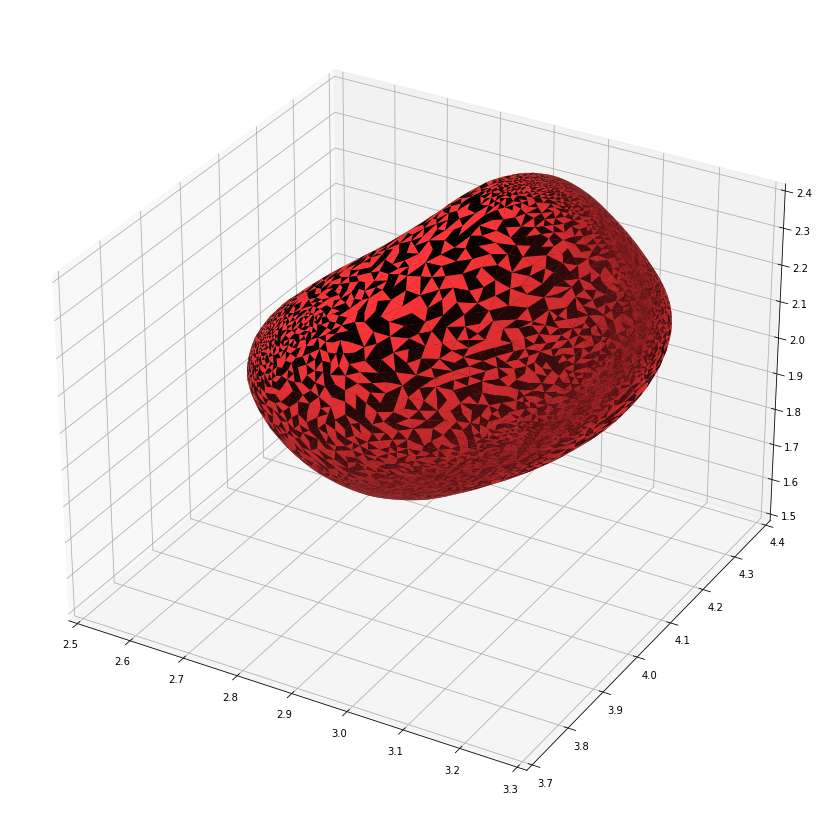

In [124]:
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(1,1,1,projection='3d')
ax.add_collection3d(deepcopy(mesh))
ax.set_xlim([2.5,3.3])
ax.set_ylim([3.7,4.4])
ax.set_zlim([1.5,2.4])


In [102]:
tri_index = index_data.reshape( (-1) )        
# then we create an indexed view into our vertices and normals
va = vertices[ faces ]
no = norm[ faces ]        

# Then to render this in OpenGL
from OpenGL import GL as gl
def render():
    gl.glEnableClientState( gl.GL_VERTEX_ARRAY )
    gl.glEnableClientState( gl.GL_NORMAL_ARRAY )
    gl.glVertexPointer( 3, gl.GL_FLOAT, 0, va )
    gl.glNormalPointer( gl.GL_FLOAT,    0, no )
    gl.glDrawArrays(gl.GL_TRIANGLES,    0, len(va) )

NameError: name 'index_data' is not defined

In [19]:
import plotly.graph_objects as go
import numpy as np

pts = np.loadtxt(np.DataSource().open('https://raw.githubusercontent.com/plotly/datasets/master/mesh_dataset.txt'))
x, y, z = pts.T

fig = go.Figure(data=[go.Mesh3d(x=x, y=y, z=z,
                   alphahull=5,
                   opacity=0.4,
                   color='cyan')])
fig.show()

In [81]:
import plotly.graph_objects as go
import numpy as np

#pts = np.loadtxt(np.DataSource().open('https://raw.githubusercontent.com/plotly/datasets/master/mesh_dataset.txt'))
x, y, z = vertices.T[0], vertices.T[1], vertices.T[2]
i, j, k = faces.T[0], faces.T[1], faces.T[2]

fig = go.Figure(data=[go.Mesh3d(x=x, y=y, z=z,
                                i=i, j=j, k=k,
                   opacity=1,
                   facecolor=rgbNew,
                   color='cyan')])
fig.show()

(9400, 4)

In [18]:
# Plot this

## work from data

In [118]:
all_masks_fns = sorted(glob.glob('/home/pilou/Projects/Ahead-Database/Automated-Parcellation/atlas_maps/*avg*.gz'))
all_masks_fns = [x for x in all_masks_fns if not 'background' in x and not 'bestlabel' in x and not 'maxlabel' in x and not 'maxproba' in x]
all_masks_fns

['/home/pilou/Projects/Ahead-Database/Automated-Parcellation/atlas_maps/ahead31_avg-amg_hem-l_skel_n105.nii.gz',
 '/home/pilou/Projects/Ahead-Database/Automated-Parcellation/atlas_maps/ahead31_avg-amg_hem-r_skel_n105.nii.gz',
 '/home/pilou/Projects/Ahead-Database/Automated-Parcellation/atlas_maps/ahead31_avg-cl_hem-l_skel_n105.nii.gz',
 '/home/pilou/Projects/Ahead-Database/Automated-Parcellation/atlas_maps/ahead31_avg-cl_hem-r_skel_n105.nii.gz',
 '/home/pilou/Projects/Ahead-Database/Automated-Parcellation/atlas_maps/ahead31_avg-fx_hem-lr_skel_n105.nii.gz',
 '/home/pilou/Projects/Ahead-Database/Automated-Parcellation/atlas_maps/ahead31_avg-gpe_hem-l_skel_n105.nii.gz',
 '/home/pilou/Projects/Ahead-Database/Automated-Parcellation/atlas_maps/ahead31_avg-gpe_hem-r_skel_n105.nii.gz',
 '/home/pilou/Projects/Ahead-Database/Automated-Parcellation/atlas_maps/ahead31_avg-gpi_hem-l_skel_n105.nii.gz',
 '/home/pilou/Projects/Ahead-Database/Automated-Parcellation/atlas_maps/ahead31_avg-gpi_hem-r_skel

In [181]:
#raw_data = nib.load(all_masks_fns[-1]).get_fdata()

## Aging models determine color

In [254]:
model_dir = 'app/subcortex-app/data/winning_models/'
qmri_models = models = pd.read_pickle(os.path.join(model_dir, 'qmri_age_models.pkl'))
location_models = pd.read_pickle(os.path.join(model_dir, 'location_models_acrosshemispheres.pkl'))
location_models = location_models.rename(columns={'metric': 'qMRI'})   # for compatibility
models = pd.concat([qmri_models, location_models])

def get_location_shift(result, age, sex=0.5):
    location = result.predict(pd.DataFrame({'Age': age, 'Age2': age**2, 'sex': 0.5}, index=[0])).iloc[0]
    int_loc = result.predict(pd.DataFrame({'Age': 19, 'Age2': 19**2, 'sex': 0.5}, index=[0])).iloc[0]
    return location-int_loc

def get_prediction(result, age, sex=0.5):
    return result.predict(pd.DataFrame({'Age': age, 'Age2': age**2, 'sex': 0.5}, index=[0])).iloc[0]


In [321]:
qMRI = 'myelin'
roi_name = 'AMG'
statistic = 'median'
age = 19

In [492]:
intensity = get_prediction(models.loc[(models.qMRI == qMRI) & (models.ROI == roi_name) & (models.Statistic == statistic), 'result'].iloc[0], age=age)
import matplotlib.cm as cm
vmin = -5
vmax = 30
norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax, clip=False)
mapper = cm.ScalarMappable(norm=norm, cmap=cm.Blues)
color = mapper.to_rgba(intensity)

# load single mesh & plot

In [489]:
fn = all_masks_fns[0]
roi_name = regex.match(fn).groupdict()['roi']
hemisphere = regex.match(fn).groupdict()['hemisphere']
mask_name = regex.match(fn).groupdict()['roi'] + regex.match(fn).groupdict()['hemisphere']
print(f'{roi_name}... ', end='')

# data
raw_data = nib.load(fn).get_fdata()

marchCubeSpace = 1.0 / 50.0
verts, faces, normals, values = measure.marching_cubes(raw_data, 0.5, spacing=(marchCubeSpace, marchCubeSpace, marchCubeSpace))

# Create Ploy3D and set up a light source
mesh = Poly3DCollection(verts[faces], alpha=1.0)
ls = LightSource(azdeg=225.0, altdeg=45.0)

# First change - normals are per vertex, so I made it per face.
normalsarray = np.array([np.array((np.sum(normals[face[:], 0]/3), np.sum(normals[face[:], 1]/3), 
                                   np.sum(normals[face[:], 2]/3))/np.sqrt(np.sum(normals[face[:], 0]/3)**2 + np.sum(normals[face[:], 1]/3)**2 + np.sum(normals[face[:], 2]/3)**2)) for face in faces])

# Next this is more asthetic, but it prevents the shadows of the image being too dark. (linear interpolation to correct)
min_ = np.min(ls.shade_normals(normalsarray, fraction=1.0)) # min shade value
max_ = np.max(ls.shade_normals(normalsarray, fraction=1.0)) # max shade value
diff = max_-min_
newMin = 0 # 0.3
newMax = 1 # 0.95
newdiff = newMax-newMin

# Using a constant color, put in desired RGB values here.
# colourRGB = np.array(color) #np.array((255.0/255.0, 54.0/255.0, 57/255.0, 1.0))

## 
age = 19
roi_name = roi_name.upper()
median_intensity = get_prediction(models.loc[(models.qMRI == qMRI) & (models.ROI == roi_name) & (models.Statistic == 'median'), 'result'].iloc[0], age=age)
iqr_intensity = get_prediction(models.loc[(models.qMRI == qMRI) & (models.ROI == roi_name) & (models.Statistic == 'iqr'), 'result'].iloc[0], age=age)

# Color per face
random_intensities = np.random.normal(median_intensity, iqr_intensity, faces.shape[0]) #color
colourRGB = mapper.to_rgba(random_intensities)

# The correct shading for shadows are now applied. Use the face normals and light orientation to generate a shading value and apply to the RGB colors for each face.
rgbNew = colourRGB*(newMin + newdiff*((ls.shade_normals(normalsarray, fraction=1.0)[:,np.newaxis]-min_)/diff))
# for i in range(rgbNew.shape[0]):
#     shade = ls.shade_normals(normalsarray, fraction=1.0)[i]
#     rgbNew[i,] = colourRGB[i,]*(newMin + newdiff*((shade-min_)/diff))

# Apply color to face
mesh.set_facecolor(rgbNew)

# old subjects
age = 75
median_intensity = get_prediction(models.loc[(models.qMRI == qMRI) & (models.ROI == roi_name) & (models.Statistic == 'median'), 'result'].iloc[0], age=age)
iqr_intensity = get_prediction(models.loc[(models.qMRI == qMRI) & (models.ROI == roi_name) & (models.Statistic == 'iqr'), 'result'].iloc[0], age=age)

old_mesh = deepcopy(mesh)
random_intensities = np.random.normal(median_intensity, iqr_intensity, faces.shape[0]) #color
colourRGB = mapper.to_rgba(random_intensities)

# The correct shading for shadows are now applied. Use the face normals and light orientation to generate a shading value and apply to the RGB colors for each face.
rgbNew = colourRGB*(newMin + newdiff*((ls.shade_normals(normalsarray, fraction=1.0)[:,np.newaxis]-min_)/diff))

# rgbNew = np.empty_like(colourRGB)
# for i in range(rgbNew.shape[0]):
#     shade = ls.shade_normals(normalsarray, fraction=1.0)[i]
#     rgbNew[i,] = colourRGB[i,]*(newMin + newdiff*((shade-min_)/diff))

old_mesh.set_facecolor(rgbNew)
#all_meshes.append({'mesh':deepcopy(mesh), 'ranges': [verts.min(0), verts.max(0)], 'name': mask_name})

amg... 

In [490]:
print(random_intensities.max())

20.733624781275566


(1.5, 2.5)

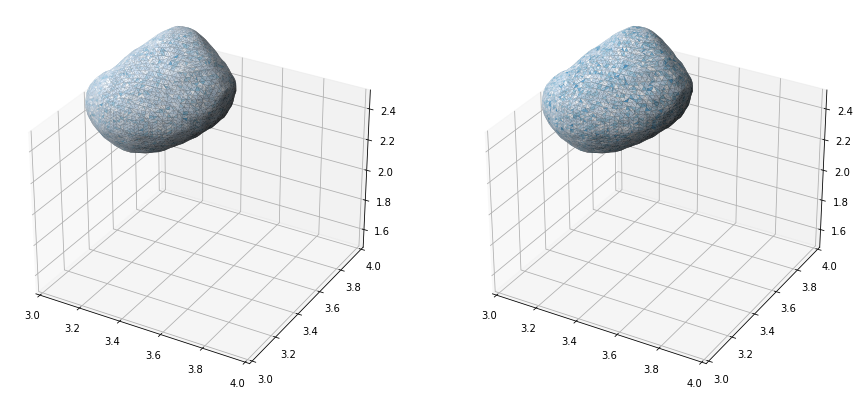

In [491]:
### plot
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(1,2,1,projection='3d')
ax.add_collection3d(deepcopy(mesh))
ax.set_xlim([3,4])
ax.set_ylim([3,4])
ax.set_zlim([1.5,2.5])

ax = fig.add_subplot(1,2,2,projection='3d')
ax.add_collection3d(deepcopy(old_mesh))
ax.set_xlim([3,4])
ax.set_ylim([3,4])
ax.set_zlim([1.5,2.5])

## apply to all meshes

In [339]:
models.ROI.unique()

array(['3V', '4V', 'AMG', 'CL', 'GPe', 'GPi', 'LV', 'PAG', 'PPN', 'RN',
       'SN', 'STN', 'STR', 'THA', 'VTA', 'fx', 'ic'], dtype=object)

In [336]:
all_masks_fns

['/home/pilou/Projects/Ahead-Database/Automated-Parcellation/atlas_maps/ahead31_avg-amg_hem-l_skel_n105.nii.gz',
 '/home/pilou/Projects/Ahead-Database/Automated-Parcellation/atlas_maps/ahead31_avg-amg_hem-r_skel_n105.nii.gz',
 '/home/pilou/Projects/Ahead-Database/Automated-Parcellation/atlas_maps/ahead31_avg-cl_hem-l_skel_n105.nii.gz',
 '/home/pilou/Projects/Ahead-Database/Automated-Parcellation/atlas_maps/ahead31_avg-cl_hem-r_skel_n105.nii.gz',
 '/home/pilou/Projects/Ahead-Database/Automated-Parcellation/atlas_maps/ahead31_avg-fx_hem-lr_skel_n105.nii.gz',
 '/home/pilou/Projects/Ahead-Database/Automated-Parcellation/atlas_maps/ahead31_avg-gpe_hem-l_skel_n105.nii.gz',
 '/home/pilou/Projects/Ahead-Database/Automated-Parcellation/atlas_maps/ahead31_avg-gpe_hem-r_skel_n105.nii.gz',
 '/home/pilou/Projects/Ahead-Database/Automated-Parcellation/atlas_maps/ahead31_avg-gpi_hem-l_skel_n105.nii.gz',
 '/home/pilou/Projects/Ahead-Database/Automated-Parcellation/atlas_maps/ahead31_avg-gpi_hem-r_skel

In [657]:
from skimage import measure
all_meshes_data = {}

for fn in all_masks_fns:
    #
    roi_name = regex.match(fn).groupdict()['roi']
    hemisphere = regex.match(fn).groupdict()['hemisphere']
    mask_name = regex.match(fn).groupdict()['roi'] + regex.match(fn).groupdict()['hemisphere']
    
    if roi_name == 'gpe':
        roi_name = 'GPe'
    elif roi_name == 'gpi':
        roi_name = 'GPi'
    elif mask_name == 'vent3':
        roi_name = '3V'
    elif mask_name == 'vent4':
        roi_name = '4V'
    elif mask_name == 'ventr' or mask_name == 'ventl':
        roi_name = 'LV'
    elif roi_name == 'fx':
        roi_name = 'fx'
    elif roi_name == 'ic':
        roi_name = 'ic'
    else:
        roi_name = roi_name.upper()
    print(f'{roi_name}... ', end='')

    # data
    raw_data = nib.load(fn).get_fdata()
    
    marchCubeSpace = 1.0 / 50.0
    verts, faces, normals, values = measure.marching_cubes(raw_data, 0.5, spacing=(marchCubeSpace, marchCubeSpace, marchCubeSpace))
    all_meshes_data[roi_name + '-' + hemisphere] = {'verts': verts, 'faces': faces, 'normals': normals, 'values': values}
    
    save_fn = f'./objs/{roi_name}-{hemisphere}.obj'
    if not os.path.exists(os.path.dirname(save_fn)):
        os.makedirs(os.path.dirname(save_fn))
    write_obj(save_fn, verts, faces, normals)

AMG... AMG... CL... CL... fx... GPe... GPe... GPi... GPi... ic... ic... PAG... PAG... PPN... PPN... RN... RN... SN... SN... STN... STN... STR... STR... THA... THA... 3V... 4V... LV... LV... VTA... VTA... 

In [ ]:
# Optimize meshes a bit, should look prettier
import subprocess
if not os.path.exists('./objs/optimized'):
    os.makedirs('./objs/optimized')

for fn in sorted(glob.glob('./objs/*.obj')):
    print(fn)
    output_fn = fn.replace('objs/', 'objs/optimized/')
    subprocess.run(["optimesh", "-n 100", fn, output_fn])

# Another run, longer this time
for fn in sorted(glob.glob('./objs/optimized/*.obj')):
    output_fn = fn #.replace('objs/', 'objs/optimized/')
    subprocess.run(["optimesh", "-n 1000", fn, output_fn])


./objs/3V-3.obj
./objs/4V-4.obj
./objs/AMG-l.obj
./objs/AMG-r.obj
./objs/CL-l.obj
./objs/CL-r.obj
./objs/GPe-l.obj
./objs/GPe-r.obj
./objs/GPi-l.obj
./objs/GPi-r.obj
./objs/LV-l.obj


## need to reconstruct normals: https://sites.google.com/site/dlampetest/python/calculating-normals-of-a-triangle-mesh-using-numpy

In [515]:
from scipy.stats import truncnorm

In [644]:
all_meshes = []

qMRI = 'myelin'
vmax = 20  # for mylein, 35 for iron

# First run: just get all random intensities, required for normalizing
all_intensities = np.array([])
for roi_name, mesh_data in all_meshes_data.items():
    print(f'{roi_name}... ', end='')
    
    roi_name, hemisphere = roi_name.split('-')
    verts = mesh_data['verts']
    faces = mesh_data['faces']
    normals = mesh_data['normals']
    
    ## 
    age = 19
    median_intensity = get_prediction(models.loc[(models.qMRI == qMRI) & (models.ROI == roi_name) & (models.Statistic == 'median'), 'result'].iloc[0], age=age)
    iqr_intensity = get_prediction(models.loc[(models.qMRI == qMRI) & (models.ROI == roi_name) & (models.Statistic == 'iqr'), 'result'].iloc[0], age=age)

    random_intensities1 = truncnorm.rvs(0, 35, loc=median_intensity, scale=iqr_intensity*1.349425*0.9, size=faces.shape[0])
#     print('True IQR: {}, found IQR: {}, found sd: {}'.format(iqr_intensity, stats.iqr(random_intensities1), random_intensities1.std()))
#     print('ratio true/found IQR: {}'.format(iqr_intensity/stats.iqr(random_intensities1)))

    #random_intensities1 = np.random.normal(median_intensity, iqr_intensity*1.349425, faces.shape[0]) #color  # in normal dist, sd = ~1.349x IQR
    age = 75
    median_intensity = get_prediction(models.loc[(models.qMRI == qMRI) & (models.ROI == roi_name) & (models.Statistic == 'median'), 'result'].iloc[0], age=age)
    iqr_intensity = get_prediction(models.loc[(models.qMRI == qMRI) & (models.ROI == roi_name) & (models.Statistic == 'iqr'), 'result'].iloc[0], age=age)
    #random_intensities2 = np.random.normal(median_intensity, iqr_intensity*1.349425, faces.shape[0]) #color
    random_intensities2 = truncnorm.rvs(0, 35, loc=median_intensity, scale=iqr_intensity*1.349425*0.9, size=faces.shape[0])

    all_intensities = np.concatenate([all_intensities, random_intensities1, random_intensities2])

vmin = 0 #np.percentile(all_intensities, q=5)
norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax, clip=False)
mapper = cm.ScalarMappable(norm=norm, cmap=cm.Blues)
#color = mapper.to_rgba(intensity)

for roi_name, mesh_data in all_meshes_data.items():
    print(f'{roi_name}... ', end='')
    
    roi_name, hemisphere = roi_name.split('-')
    verts = mesh_data['verts']
    faces = mesh_data['faces']
    normals = mesh_data['normals']
    
    # Create Ploy3D and set up a light source
    mesh = Poly3DCollection(verts[faces], alpha=1.0)
    if hemisphere == 'l':
        azdeg = 0
    else:
        azdeg = 180  # flip light source for right hemisphere
    
    ls = LightSource(azdeg=azdeg, altdeg=45.0)
        
    # First change - normals are per vertex, so I made it per face.
    normalsarray = np.array([np.array((np.sum(normals[face[:], 0]/3), np.sum(normals[face[:], 1]/3), 
                                       np.sum(normals[face[:], 2]/3))/np.sqrt(np.sum(normals[face[:], 0]/3)**2 + np.sum(normals[face[:], 1]/3)**2 + np.sum(normals[face[:], 2]/3)**2)) for face in faces])

    # Next this is more asthetic, but it prevents the shadows of the image being too dark. (linear interpolation to correct)
    min_ = np.min(ls.shade_normals(normalsarray, fraction=1.0)) # min shade value
    max_ = np.max(ls.shade_normals(normalsarray, fraction=1.0)) # max shade value
    diff = max_-min_
    newMin = 0 # 0.3
    newMax = 1 # 0.95
    newdiff = newMax-newMin

    # Using a constant color, put in desired RGB values here.
    # colourRGB = np.array(color) #np.array((255.0/255.0, 54.0/255.0, 57/255.0, 1.0))

    ## 
    age = 19
#    roi_name = roi_name.upper()
    median_intensity = get_prediction(models.loc[(models.qMRI == qMRI) & (models.ROI == roi_name) & (models.Statistic == 'median'), 'result'].iloc[0], age=age)
    iqr_intensity = get_prediction(models.loc[(models.qMRI == qMRI) & (models.ROI == roi_name) & (models.Statistic == 'iqr'), 'result'].iloc[0], age=age)

    # Color per face
    random_intensities = truncnorm.rvs(0, 35, loc=median_intensity, scale=iqr_intensity*1.349425*0.9, size=faces.shape[0])
#    random_intensities = np.random.normal(median_intensity, iqr_intensity*1.349425, faces.shape[0]) #color  # in normal dist, sd = ~1.349x IQR
    colourRGB = mapper.to_rgba(random_intensities)

    # The correct shading for shadows are now applied. Use the face normals and light orientation to generate a shading value and apply to the RGB colors for each face.
#    rgbNew = np.empty_like(colourRGB)
#    for i in range(rgbNew.shape[0]):
#        shade = ls.shade_normals(normalsarray, fraction=1.0)[i]
#        rgbNew[i,] = colourRGB[i,]*(newMin + newdiff*((shade-min_)/diff))
    rgbNew = colourRGB*(newMin + newdiff*((ls.shade_normals(normalsarray, fraction=1.0)[:,np.newaxis]-min_)/diff))
    # Apply color to face
    mesh.set_facecolor(rgbNew)

    # old subjects
    age = 75
    median_intensity = get_prediction(models.loc[(models.qMRI == qMRI) & (models.ROI == roi_name) & (models.Statistic == 'median'), 'result'].iloc[0], age=age)
    iqr_intensity = get_prediction(models.loc[(models.qMRI == qMRI) & (models.ROI == roi_name) & (models.Statistic == 'iqr'), 'result'].iloc[0], age=age)

    old_mesh = deepcopy(mesh)
    random_intensities = truncnorm.rvs(0, 35, loc=median_intensity, scale=iqr_intensity*1.349425*0.9, size=faces.shape[0])
#    random_intensities = np.random.normal(median_intensity, iqr_intensity*1.349425, faces.shape[0]) #color
    colourRGB = mapper.to_rgba(random_intensities)

    # The correct shading for shadows are now applied. Use the face normals and light orientation to generate a shading value and apply to the RGB colors for each face.
    rgbNew = colourRGB*(newMin + newdiff*((ls.shade_normals(normalsarray, fraction=1.0)[:,np.newaxis]-min_)/diff))

#    rgbNew = np.empty_like(colourRGB)
#    for i in range(rgbNew.shape[0]):
#        shade = ls.shade_normals(normalsarray, fraction=1.0)[i]
#        rgbNew[i,] = colourRGB[i,]*(newMin + newdiff*((shade-min_)/diff))

    old_mesh.set_facecolor(rgbNew)
    all_meshes.append({'mesh':deepcopy(mesh), 'old_mesh':deepcopy(old_mesh), 'ranges': [verts.min(0), verts.max(0)], 'name': roi_name, 'hemisphere': hemisphere})

AMG-l... AMG-r... CL-l... CL-r... fx-lr... GPe-l... GPe-r... GPi-l... GPi-r... ic-l... ic-r... PAG-l... PAG-r... PPN-l... PPN-r... RN-l... RN-r... SN-l... SN-r... STN-l... STN-r... STR-l... STR-r... THA-l... THA-r... 3V-3... 4V-4... LV-l... LV-r... VTA-l... VTA-r... AMG-l... AMG-r... CL-l... CL-r... fx-lr... GPe-l... GPe-r... GPi-l... GPi-r... ic-l... ic-r... PAG-l... PAG-r... PPN-l... PPN-r... RN-l... RN-r... SN-l... SN-r... STN-l... STN-r... STR-l... STR-r... THA-l... THA-r... 3V-3... 4V-4... LV-l... LV-r... VTA-l... VTA-r... 

In [ ]:
all_meshes_to_plot = [x for x in all_meshes if x['name'] not in ['3V', '4V', 'LV'] and x['hemisphere'] == 'l'] # 17 - 3 = 14 meshes; so let's try 4x4?

# Plot all, see if young -> old changes can be seen
fig = plt.figure(figsize=(16/2.54, 16/2.54)) # 16 x 16 cm should fit on A4 (keeping margins in mind)
gs = matplotlib.gridspec.GridSpec(4*3, # row for meshes, row for scatters, row empty 
                                  4*3, # two cols for meshes/scatters, one col empty 
                                  figure=fig, left=None, bottom=None, right=None, top=None, wspace=0, hspace=0, 
                                  width_ratios=[1,1,0.5] * 4, 
                                  height_ratios=[1,1,0.5] * 4)

for i,mesh in enumerate(all_meshes_to_plot):
    row = i%4 * 3  # two rows per 'subplot', one empty
    col = np.floor(i/4).astype(int) * 3 # two columns per 'subplot', one empty
    
    # Mesh young
    ax = fig.add_subplot(gs[row, col], projection='3d')
    ax.add_collection3d(deepcopy(mesh['mesh']))
    ax.set_xlim([mesh['ranges'][0][0], mesh['ranges'][1][0]])
    ax.set_ylim([mesh['ranges'][0][1], mesh['ranges'][1][1]])
    ax.set_zlim([mesh['ranges'][0][2], mesh['ranges'][1][2]])
    ax.axis('off')

    ax = fig.add_subplot(gs[row+1,col])
    ax.plot([0,1,2,3,4], [0,1,2,3,4])
    ax = fig.add_subplot(gs[row+1,col+1])
    ax.plot([0,1,2,3,4], [0,1,2,3,4])
    
    # Mesh old [same mesh, different colors]
    ax = fig.add_subplot(gs[row,col+1], projection='3d')
    ax.add_collection3d(deepcopy(mesh['mesh']))
    ax.set_xlim([mesh['ranges'][0][0], mesh['ranges'][1][0]])
    ax.set_ylim([mesh['ranges'][0][1], mesh['ranges'][1][1]])
    ax.set_zlim([mesh['ranges'][0][2], mesh['ranges'][1][2]])
    ax.axis('off')
    sns.despine()

In [397]:
fig.savefig('./tmp.png', bbox_inches='tight')
fig.savefig('./tmp.pdf', bbox_inches='tight')

(2.429673767089844, 2.8740115356445313)

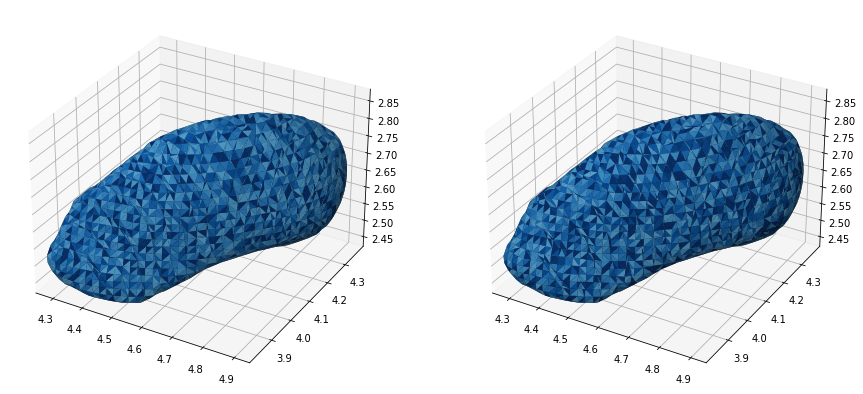

In [526]:
### plot
mesh = all_meshes[8]

fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(1,2,1,projection='3d')
ax.add_collection3d(deepcopy(mesh['mesh']))
ax.set_xlim([mesh['ranges'][0][0], mesh['ranges'][1][0]])
ax.set_ylim([mesh['ranges'][0][1], mesh['ranges'][1][1]])
ax.set_zlim([mesh['ranges'][0][2], mesh['ranges'][1][2]])

ax = fig.add_subplot(1,2,2,projection='3d')
ax.add_collection3d(deepcopy(mesh['old_mesh']))
ax.set_xlim([mesh['ranges'][0][0], mesh['ranges'][1][0]])
ax.set_ylim([mesh['ranges'][0][1], mesh['ranges'][1][1]])
ax.set_zlim([mesh['ranges'][0][2], mesh['ranges'][1][2]])

In [ ]:
## Let's just try to get in the scatterplots for now

In [399]:
df = pd.read_pickle(os.path.join(model_dir, 'qMRI_data_collapsed.pkl'))
df['qMRI'] = df['Intensity']
df['Sex'] = df['sex'].map({0: 'Female', 1: 'Male'})
df = df.loc[df.Intensity != 'qpd']
## Remove Cortex, Cerebellum, save
df = df.loc[~df.ROI.isin(['Cerebellum', 'Cortex'])]

# to save
df2 = df.copy()
del df2['Segmentation']
del df2['Measure']
del df2['icv']
del df2['sex']
del df2['ROI2']
del df2['Age2']
del df2['cooks_d']
del df2['high_cook']
del df2['qMRI']

df2 = df2.sample(frac = 1) 
df2 = df2[['ROI', 'Intensity', 'Statistic', 'Sex', 'Age',  'Value']]
df2 = df2.sort_values(['ROI', 'Intensity', 'Statistic', 'Sex', 'Age']).reset_index(drop=True)


# In[17]:


# Prediction dfs
pred_dfM = pd.DataFrame({'Age': np.arange(19, 81),
                         'Age2': np.arange(19, 81)**2,
                         'sex': 1})
pred_dfF = pd.DataFrame({'Age': np.arange(19, 81),
                         'Age2': np.arange(19, 81)**2,
                         'sex': 0})

In [400]:
import seaborn as sns

In [424]:
prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']

['#1f77b4',
 '#ff7f0e',
 '#2ca02c',
 '#d62728',
 '#9467bd',
 '#8c564b',
 '#e377c2',
 '#7f7f7f',
 '#bcbd22',
 '#17becf']

AMG-l: ax.azim 30, ax.elev 30
CL-l: ax.azim 30, ax.elev 30
fx-lr: ax.azim 30, ax.elev 30
GPe-l: ax.azim 30, ax.elev 30
GPi-l: ax.azim 30, ax.elev 30
ic-l: ax.azim 30, ax.elev 30
PAG-l: ax.azim 30, ax.elev 30
PPN-l: ax.azim 30, ax.elev 30
RN-l: ax.azim 30, ax.elev 30
SN-l: ax.azim 30, ax.elev 30
STN-l: ax.azim 30, ax.elev 30
STR-l: ax.azim 30, ax.elev 30
THA-l: ax.azim 30, ax.elev 30
VTA-l: ax.azim 30, ax.elev 30
..............................................................

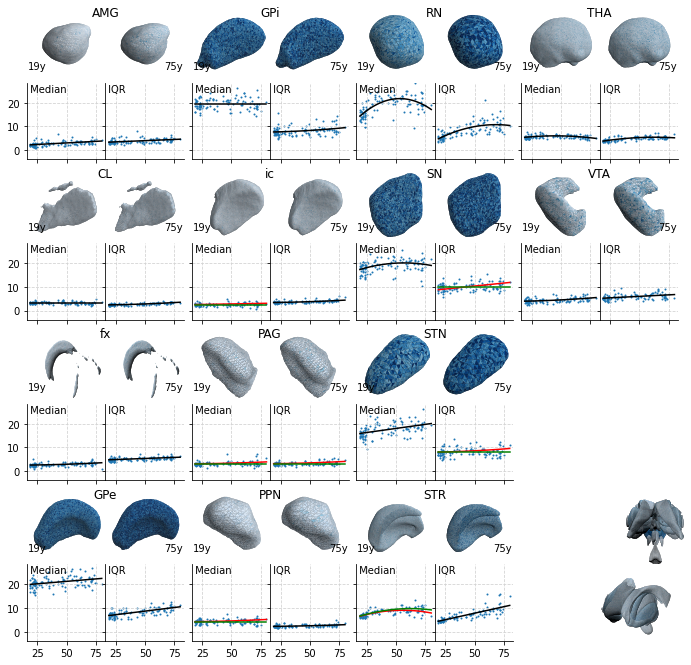

In [589]:
# #all_meshes_to_plot = [x for x in all_meshes if x['name'] not in ['3V', '4V', 'LV'] and x['hemisphere'] in ['l', 'lr']] # 17 - 3 = 14 meshes; so let's try 4x4?
# meshes_df = pd.DataFrame(all_meshes)
# meshes_to_plot = meshes_df.loc[(~meshes_df.name.isin(['3V', '4V', 'LV']))&(meshes_df.hemisphere.isin(['l', 'lr']))]

# # Plot all, see if young -> old changes can be seen
# xwidth_cm = 30 #16
# fig = plt.figure(figsize=(xwidth_cm/2.54, xwidth_cm/2.54)) # 16 x 16 cm should fit on A4 (keeping margins in mind)
# gs = matplotlib.gridspec.GridSpec(4*3, # row for meshes, row for scatters, row empty 
#                                   4*3, # two cols for meshes/scatters, one col empty 
#                                   figure=fig, left=None, bottom=None, right=None, top=None, wspace=0, hspace=0, 
#                                   width_ratios=[1,1,0.1] * 4, 
#                                   height_ratios=[1,1,0.1] * 4)
# measure = 'myelin'#'iron'

# scatter_ylim = [df2.loc[(df2['Intensity'] == measure),'Value'].min(),df2.loc[(df2['Intensity'] == measure),'Value'].max()]
# for i,(idx,row_data) in enumerate(meshes_to_plot.iterrows()):
#     row = i%4 * 3  # two rows per 'subplot', one empty
#     col = np.floor(i/4).astype(int) * 3 # two columns per 'subplot', one empty

#     # Mesh young
#     for ii, mesh_type in enumerate(['young_left', 'old_right']):
#         if ii == 1:
# #             if not row_data['name'] == 'fx':
# #                 mesh = meshes_df.loc[(meshes_df['name'] == row_data['name']) & (meshes_df['hemisphere'] == 'r'),'old_mesh'].iloc[0] # old, right
# #                 ranges = meshes_df.loc[(meshes_df['name'] == row_data['name']) & (meshes_df['hemisphere'] == 'r'),'ranges'].iloc[0] #
# #             else:
#             mesh = row_data['old_mesh']  # old, same because no left/right
#             ranges = row_data['ranges']
#         else:
#             mesh = row_data['mesh']     # young, left
#             ranges = row_data['ranges']
            
#         ax = fig.add_subplot(gs[row, col+ii], projection='3d')
#         ax.add_collection3d(deepcopy(mesh))
#         ax.set_xlim([ranges[0][0], ranges[1][0]])
#         ax.set_ylim([ranges[0][1], ranges[1][1]])
#         ax.set_zlim([ranges[0][2], ranges[1][2]])
#         ax.axis('off')
#         ax.set_box_aspect(aspect=(1,1,1),zoom=1.2)
# #         if ii == 1:
# #             ax.view_init(20, 180)
# #         else:
#         ax.view_init(30, 30)
#         if ii == 0:
#             print('{}: ax.azim {}, ax.elev {}'.format(row_data['name'] + '-' + row_data['hemisphere'], ax.azim, ax.elev))
#             ax.set_title('19y', loc='left', y=.1, fontdict={'fontsize': 10})
#         else:
#             ax.set_title('75y', loc='right', y=.1, fontdict={'fontsize': 10})

#     ax = fig.add_subplot(gs[slice(row, row+3), slice(col, col+2)])
#     ax.set_title(row_data['name'], y=.9)
#     ax.axis('off')
    
#     # scatterplots
#     for ii, intensity in enumerate(['median', 'iqr']):
#         ax = fig.add_subplot(gs[row+1,col+ii])
#         data_ = df2.loc[(df2['ROI']==row_data['name']) & (df2['Intensity'] == measure) & (df2['Statistic'] == intensity)]
#         ax.grid(linestyle='--', color='lightgrey')
#         ax.scatter(data_.Age, data_.Value, s=1, color=colors[0])
#         ax.set_ylim(scatter_ylim)
#         if row/3 < 3:
#             ax.set_xticklabels([])
#         # model
#         result_ = models.loc[(models.ROI == row_data['name']) & (models.qMRI == measure) & (models.Statistic == intensity), 'result'].iloc[0]
#         pred1 = result_.predict(pred_dfM)
#         pred2 = result_.predict(pred_dfF)
#         if (pred1 == pred2).all():
#             ax.plot(np.arange(19,81), pred1, 'k')
#         else:
#             ax.plot(np.arange(19,81), pred1, 'red')
#             ax.plot(np.arange(19,81), pred2, 'green')
#         ax.set_yticks([0,10,20])
#         if col > 0 or ii == 1:
#             ax.set_yticklabels([])
#         title_text = ' Median' if intensity == 'median' else ' IQR'
#         ax.set_title(title_text, y=.8, loc='left', fontdict={'fontsize': 10})
    

# # complete subcortex?
# ax = fig.add_subplot(gs[-2:,-2:], projection='3d')
# minmax = [[0,0,0],[0,0,0]]
# for i,(idx,row_data) in enumerate(meshes_df.iterrows()):
#     print('.', end='')
#     mesh = row_data['mesh']     # young, left
#     ranges = row_data['ranges']
#     ax.add_collection3d(deepcopy(mesh))
# ax.set_xlim([3,6])
# ax.set_ylim([3,6])
# ax.set_zlim([1.5,4.5])
# ax.axis('off')
# ax.set_box_aspect(aspect=(1,1,1),zoom=1.2)

# #
# ax = fig.add_subplot(gs[-4:-2,-2:], projection='3d')
# for i,(idx,row_data) in enumerate(meshes_df.iterrows()):
#     print('.', end='')
#     mesh = row_data['mesh']     # young, left
#     ranges = row_data['ranges']
#     ax.add_collection3d(deepcopy(mesh))
# ax.set_xlim([3,6])
# ax.set_ylim([3,6])
# ax.set_zlim([1.5,4.5])
# ax.axis('off')
# ax.set_box_aspect(aspect=(1,1,1),zoom=1.2)
# ax.view_init(30, 90)


# sns.despine()

AMG-l: ax.azim 30, ax.elev 30
CL-l: ax.azim 30, ax.elev 30
fx-lr: ax.azim 30, ax.elev 30
GPe-l: ax.azim 30, ax.elev 30
GPi-l: ax.azim 30, ax.elev 30
ic-l: ax.azim 30, ax.elev 30
PAG-l: ax.azim 30, ax.elev 30
PPN-l: ax.azim 30, ax.elev 30
RN-l: ax.azim 30, ax.elev 30
SN-l: ax.azim 30, ax.elev 30
STN-l: ax.azim 30, ax.elev 30
STR-l: ax.azim 30, ax.elev 30
THA-l: ax.azim 30, ax.elev 30
VTA-l: ax.azim 30, ax.elev 30
............................

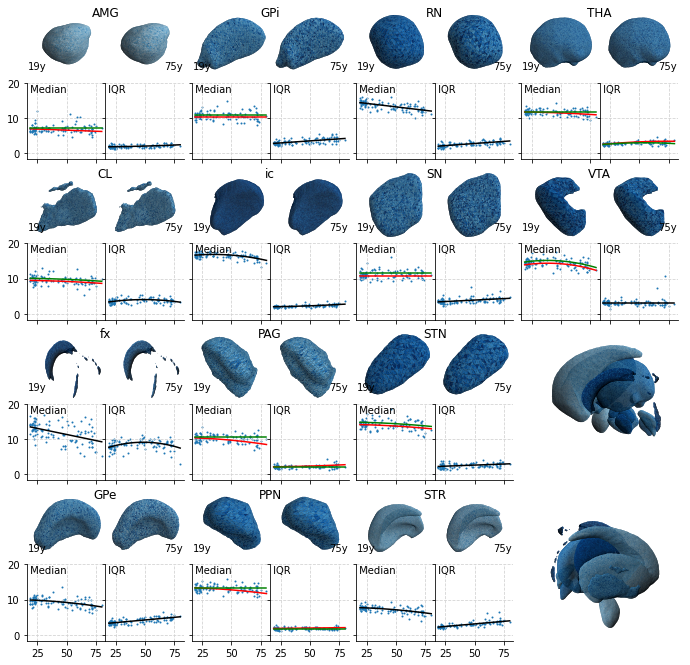

In [645]:
#all_meshes_to_plot = [x for x in all_meshes if x['name'] not in ['3V', '4V', 'LV'] and x['hemisphere'] in ['l', 'lr']] # 17 - 3 = 14 meshes; so let's try 4x4?
meshes_df = pd.DataFrame(all_meshes)
meshes_to_plot = meshes_df.loc[(~meshes_df.name.isin(['3V', '4V', 'LV']))&(meshes_df.hemisphere.isin(['l', 'lr']))]

# Plot all, see if young -> old changes can be seen
xwidth_cm = 30 #16
fig = plt.figure(figsize=(xwidth_cm/2.54, xwidth_cm/2.54)) # 16 x 16 cm should fit on A4 (keeping margins in mind)
gs = matplotlib.gridspec.GridSpec(4*3, # row for meshes, row for scatters, row empty 
                                  4*3, # two cols for meshes/scatters, one col empty 
                                  figure=fig, left=None, bottom=None, right=None, top=None, wspace=0, hspace=0, 
                                  width_ratios=[1,1,0.1] * 4, 
                                  height_ratios=[1,1,0.1] * 4)

measure = 'myelin'
scatter_ylim = [df2.loc[(df2['Intensity'] == measure),'Value'].min(),df2.loc[(df2['Intensity'] == measure),'Value'].max()]
for i,(idx,row_data) in enumerate(meshes_to_plot.iterrows()):
    row = i%4 * 3  # two rows per 'subplot', one empty
    col = np.floor(i/4).astype(int) * 3 # two columns per 'subplot', one empty

    # Mesh young
    for ii, mesh_type in enumerate(['young_left', 'old_right']):
        if ii == 1:
#             if not row_data['name'] == 'fx':
#                 mesh = meshes_df.loc[(meshes_df['name'] == row_data['name']) & (meshes_df['hemisphere'] == 'r'),'old_mesh'].iloc[0] # old, right
#                 ranges = meshes_df.loc[(meshes_df['name'] == row_data['name']) & (meshes_df['hemisphere'] == 'r'),'ranges'].iloc[0] #
#             else:
            mesh = row_data['old_mesh']  # old, same because no left/right
            ranges = row_data['ranges']
        else:
            mesh = row_data['mesh']     # young, left
            ranges = row_data['ranges']
            
        ax = fig.add_subplot(gs[row, col+ii], projection='3d')
        ax.add_collection3d(deepcopy(mesh))
        ax.set_xlim([ranges[0][0], ranges[1][0]])
        ax.set_ylim([ranges[0][1], ranges[1][1]])
        ax.set_zlim([ranges[0][2], ranges[1][2]])
        ax.axis('off')
        ax.set_box_aspect(aspect=(1,1,1),zoom=1.2)
#         if ii == 1:
#             ax.view_init(20, 180)
#         else:
        ax.view_init(30, 30)
        if ii == 0:
            print('{}: ax.azim {}, ax.elev {}'.format(row_data['name'] + '-' + row_data['hemisphere'], ax.azim, ax.elev))
            ax.set_title('19y', loc='left', y=.1, fontdict={'fontsize': 10})
        else:
            ax.set_title('75y', loc='right', y=.1, fontdict={'fontsize': 10})

    ax = fig.add_subplot(gs[slice(row, row+3), slice(col, col+2)])
    ax.set_title(row_data['name'], y=.9)
    ax.axis('off')
    
    # scatterplots
    for ii, intensity in enumerate(['median', 'iqr']):
        ax = fig.add_subplot(gs[row+1,col+ii])
        data_ = df2.loc[(df2['ROI']==row_data['name']) & (df2['Intensity'] == measure) & (df2['Statistic'] == intensity)]
        ax.grid(linestyle='--', color='lightgrey')
        ax.scatter(data_.Age, data_.Value, s=1, color=colors[0])
        ax.set_ylim(scatter_ylim)
        if row/3 < 3:
            ax.set_xticklabels([])
        # model
        result_ = models.loc[(models.ROI == row_data['name']) & (models.qMRI == measure) & (models.Statistic == intensity), 'result'].iloc[0]
        pred1 = result_.predict(pred_dfM)
        pred2 = result_.predict(pred_dfF)
        if (pred1 == pred2).all():
            ax.plot(np.arange(19,81), pred1, 'k')
        else:
            ax.plot(np.arange(19,81), pred1, 'red')
            ax.plot(np.arange(19,81), pred2, 'green')
        ax.set_yticks([0,10,20])
        if col > 0 or ii == 1:
            ax.set_yticklabels([])
        title_text = ' Median' if intensity == 'median' else ' IQR'
        ax.set_title(title_text, y=.8, loc='left', fontdict={'fontsize': 10})
    

# complete subcortex?
ax = fig.add_subplot(gs[6:9,9:12], projection='3d')
all_ranges = []
for i,(idx,row_data) in enumerate(meshes_to_plot.iterrows()):
    print('.', end='')
    mesh = row_data['mesh']     # young, left
    all_ranges.append(row_data['ranges'])
    ax.add_collection3d(deepcopy(mesh))
xyz_min = np.array(all_ranges).min(0)[0]
xyz_max = np.array(all_ranges).max(0)[1]
ax.set_xlim([xyz_min[0],xyz_max[0]])
ax.set_ylim([xyz_min[1],xyz_max[1]])
ax.set_zlim([xyz_min[2],xyz_max[2]])
ax.axis('off')
ax.set_box_aspect(aspect=(1,1,1),zoom=1.2)
ax.view_init(30,0)
#ax.view_init(30, 60)

#
all_ranges = []
ax = fig.add_subplot(gs[9:11,9:12], projection='3d')
for i,(idx,row_data) in enumerate(meshes_to_plot.iterrows()):
    print('.', end='')
    mesh = row_data['mesh']     # young, left
    all_ranges.append(row_data['ranges'])
    ax.add_collection3d(deepcopy(mesh))
# ax.plot(1,1)
# ax.set_title('B', y=.9)
xyz_min = np.array(all_ranges).min(0)[0]
xyz_max = np.array(all_ranges).max(0)[1]
ax.set_xlim([xyz_min[0],xyz_max[0]])
ax.set_ylim([xyz_min[1],xyz_max[1]])
ax.set_zlim([xyz_min[2],xyz_max[2]])
ax.axis('off')
ax.set_box_aspect(aspect=(1,1,1),zoom=1.2)
#ax.view_init(30, 90)
#ax.view_init(-15, 60-180)
ax.view_init(30,180)

sns.despine()

In [646]:
fig.savefig('./tmp3_myelin.jpeg', dpi=150, bbox_inches='tight')

In [647]:
fig.savefig('./tmp3_myelin.pdf', bbox_inches='tight')

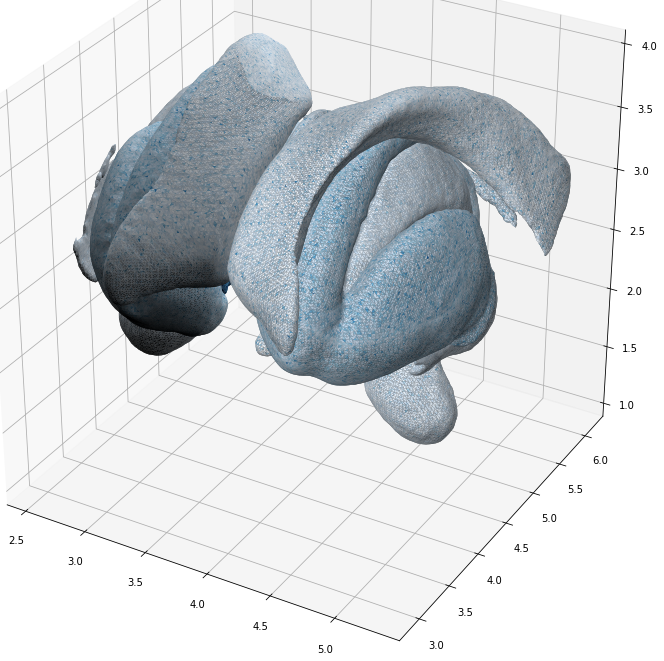

In [624]:
fig = plt.figure(figsize=(10, 10))

all_ranges = []
ax = fig.add_subplot(1,1,1,projection='3d')
for ii,(idx,row_data) in enumerate(meshes_df.iterrows()):
    mesh = row_data['mesh']  # old, same because no left/right
    all_ranges.append(row_data['ranges'])
    
    ax.add_collection3d(deepcopy(mesh))

xyz_min = np.array(all_ranges).min(0)[0]
xyz_max = np.array(all_ranges).max(0)[1]
ax.set_xlim([xyz_min[0],xyz_max[0]])
ax.set_ylim([xyz_min[1],xyz_max[1]])
ax.set_zlim([xyz_min[2],xyz_max[2]])
ax.set_box_aspect(aspect=(1,1,1),zoom=1.4)
ax.view_init(30, -60)


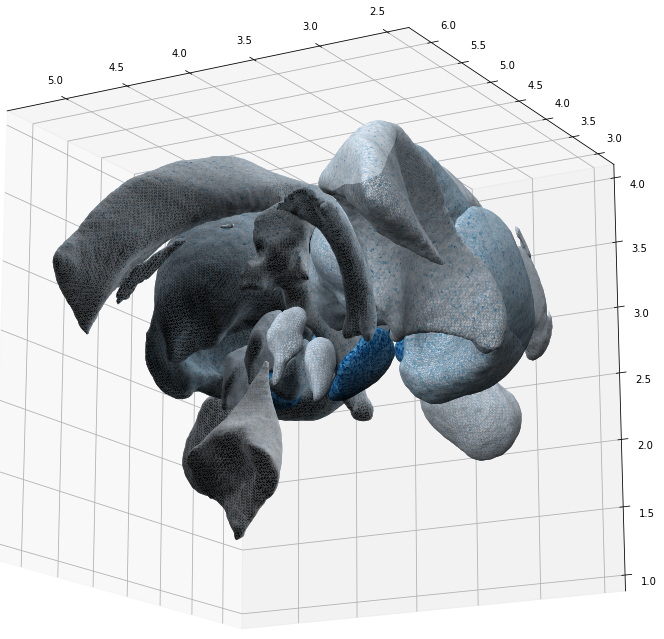

In [626]:
fig = plt.figure(figsize=(10, 10))

all_ranges = []
ax = fig.add_subplot(1,1,1,projection='3d')
for ii,(idx,row_data) in enumerate(meshes_df.iterrows()):
    mesh = row_data['mesh']  # old, same because no left/right
    all_ranges.append(row_data['ranges'])
    
    ax.add_collection3d(deepcopy(mesh))

xyz_min = np.array(all_ranges).min(0)[0]
xyz_max = np.array(all_ranges).max(0)[1]
ax.set_xlim([xyz_min[0],xyz_max[0]])
ax.set_ylim([xyz_min[1],xyz_max[1]])
ax.set_zlim([xyz_min[2],xyz_max[2]])
ax.set_box_aspect(aspect=(1,1,1),zoom=1.4)
ax.view_init(-15, -60+180)

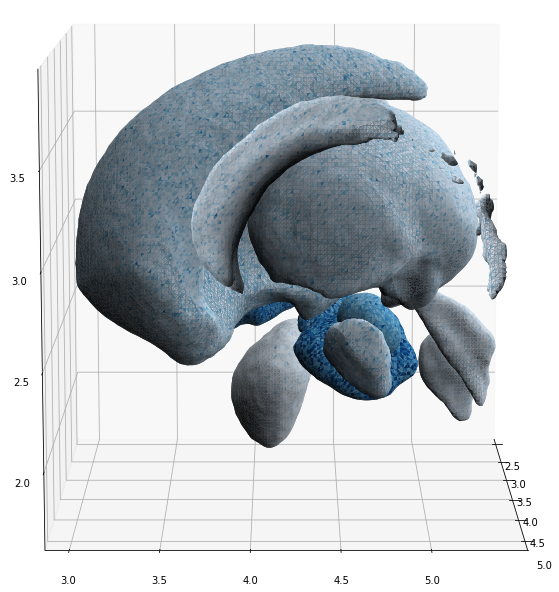

In [631]:
fig = plt.figure(figsize=(10, 10))

all_ranges = []
ax = fig.add_subplot(1,1,1,projection='3d')
for ii,(idx,row_data) in enumerate(meshes_to_plot.iterrows()):
    mesh = row_data['mesh']  # old, same because no left/right
    all_ranges.append(row_data['ranges'])
    
    ax.add_collection3d(deepcopy(mesh))

xyz_min = np.array(all_ranges).min(0)[0]
xyz_max = np.array(all_ranges).max(0)[1]
ax.set_xlim([xyz_min[0],xyz_max[0]])
ax.set_ylim([xyz_min[1],xyz_max[1]])
ax.set_zlim([xyz_min[2],xyz_max[2]])
ax.set_box_aspect(aspect=(1,1,1),zoom=1.4)
ax.view_init(10, 0)

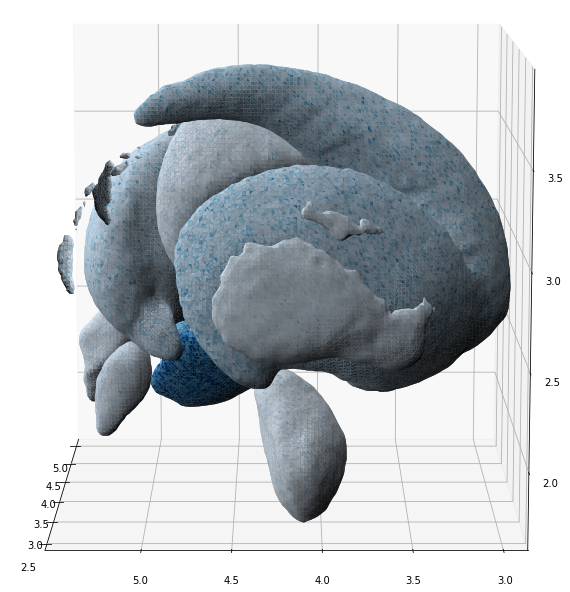

In [632]:
fig = plt.figure(figsize=(10, 10))

all_ranges = []
ax = fig.add_subplot(1,1,1,projection='3d')
for ii,(idx,row_data) in enumerate(meshes_to_plot.iterrows()):
    mesh = row_data['mesh']  # old, same because no left/right
    all_ranges.append(row_data['ranges'])
    
    ax.add_collection3d(deepcopy(mesh))

xyz_min = np.array(all_ranges).min(0)[0]
xyz_max = np.array(all_ranges).max(0)[1]
ax.set_xlim([xyz_min[0],xyz_max[0]])
ax.set_ylim([xyz_min[1],xyz_max[1]])
ax.set_zlim([xyz_min[2],xyz_max[2]])
ax.set_box_aspect(aspect=(1,1,1),zoom=1.4)
ax.view_init(10, 180)

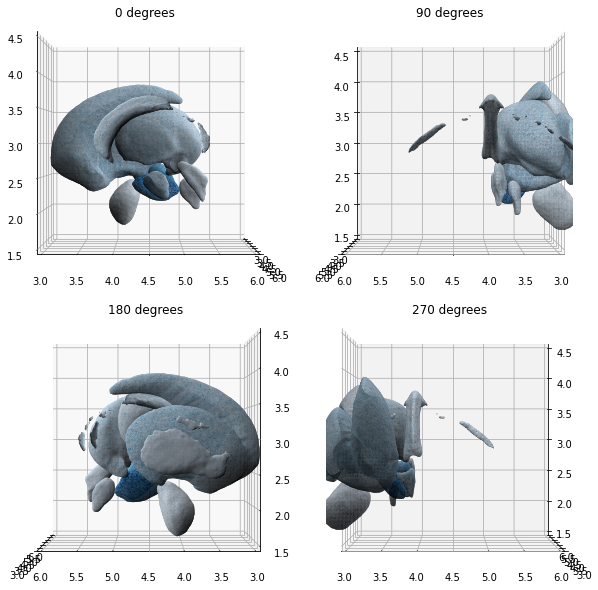

In [608]:
fig = plt.figure(figsize=(10, 10))

for i in range(4):
    ax = fig.add_subplot(2,2,i+1,projection='3d')
    for ii,(idx,row_data) in enumerate(meshes_to_plot.iterrows()):
        mesh = row_data['mesh']  # old, same because no left/right
        ranges = row_data['ranges']
        ax.add_collection3d(deepcopy(mesh))

    ax.set_xlim([3,6])
    ax.set_ylim([3,6])
    ax.set_zlim([1.5,4.5])
    ax.set_box_aspect(aspect=(1,1,1),zoom=1.4)
#     plt.axis('off')
    ax.view_init(0, i*90)
    ax.set_title('{} degrees'.format(i*90))

In [455]:
print('ax.azim {}'.format(ax.azim))
print('ax.elev {}'.format(ax.elev))

AttributeError: 'AxesSubplot' object has no attribute 'azim'

In [362]:
import scipy
from scipy import stats

stats.iqr(np.random.normal(10,25,size=10000000))/25

1.3494252088467191

## Load all meshes for plotting

In [191]:
all_meshes = []

for fn in all_masks_fns:
    if 'hem-l_' in fn:
        continue
    
    #
    roi_name = regex.match(fn).groupdict()['roi']
    hemisphere = regex.match(fn).groupdict()['hemisphere']
    mask_name = regex.match(fn).groupdict()['roi'] + regex.match(fn).groupdict()['hemisphere']
    print(f'{roi_name}... ', end='')

    # data
    raw_data = nib.load(fn).get_fdata()
    
    marchCubeSpace = 1.0 / 50.0
    verts, faces, normals, values = measure.marching_cubes(raw_data, 0.5, spacing=(marchCubeSpace, marchCubeSpace, marchCubeSpace))

    # Create Ploy3D and set up a light source
    mesh = Poly3DCollection(verts[faces], alpha=1.0)
    ls = LightSource(azdeg=225.0, altdeg=45.0)

    # First change - normals are per vertex, so I made it per face.
    normalsarray = np.array([np.array((np.sum(normals[face[:], 0]/3), np.sum(normals[face[:], 1]/3), 
                                       np.sum(normals[face[:], 2]/3))/np.sqrt(np.sum(normals[face[:], 0]/3)**2 + np.sum(normals[face[:], 1]/3)**2 + np.sum(normals[face[:], 2]/3)**2)) for face in faces])

    # Next this is more asthetic, but it prevents the shadows of the image being too dark. (linear interpolation to correct)
    min_ = np.min(ls.shade_normals(normalsarray, fraction=1.0)) # min shade value
    max_ = np.max(ls.shade_normals(normalsarray, fraction=1.0)) # max shade value
    diff = max_-min_
    newMin = 0.3
    newMax = 0.95
    newdiff = newMax-newMin

    # Using a constant color, put in desired RGB values here.
    colourRGB = np.array((255.0/255.0, 54.0/255.0, 57/255.0, 1.0))

    # The correct shading for shadows are now applied. Use the face normals and light orientation to generate a shading value and apply to the RGB colors for each face.
    rgbNew = np.array([colourRGB*(newMin + newdiff*((shade-min)/diff)) for shade in ls.shade_normals(normalsarray, fraction=1.0)])

    # Apply color to face
    mesh.set_facecolor(rgbNew)
    all_meshes.append({'mesh':deepcopy(mesh), 'ranges': [verts.min(0), verts.max(0)], 'name': mask_name})

amg... cl... fx... gpe... gpi... ic... pag... ppn... rn... sn... stn... str... tha... vent... vent... vent... vta... 

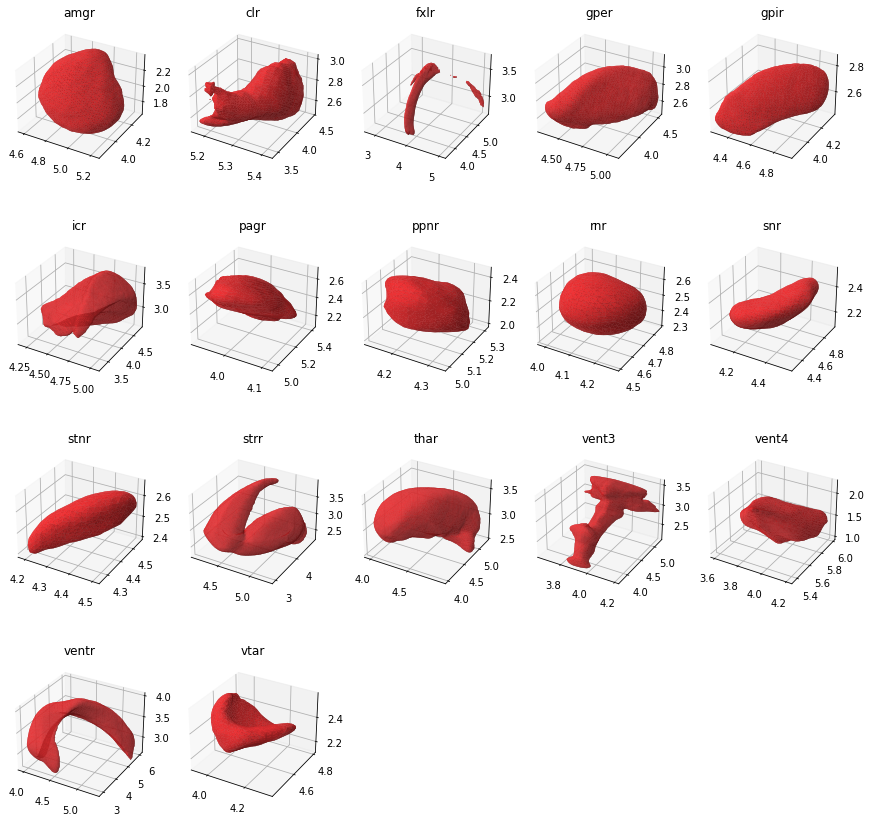

In [192]:
fig = plt.figure(figsize=(15, 15))
    
for i,mesh in enumerate(all_meshes):
    ax = fig.add_subplot(4,5,i+1,projection='3d')
    ax.add_collection3d(deepcopy(mesh['mesh']))
    ax.set_xlim([mesh['ranges'][0][0], mesh['ranges'][1][0]])
    ax.set_ylim([mesh['ranges'][0][1], mesh['ranges'][1][1]])
    ax.set_zlim([mesh['ranges'][0][2], mesh['ranges'][1][2]])
    ax.set_title(mesh['name'])
    
#    ax.grid(False)
#     ax.set_xticks([])
#     ax.set_yticks([])
#     ax.set_zticks([])
#    ax.set_frame_on(False)
#plt.axis('off')

In [ ]:
######## huge figure?

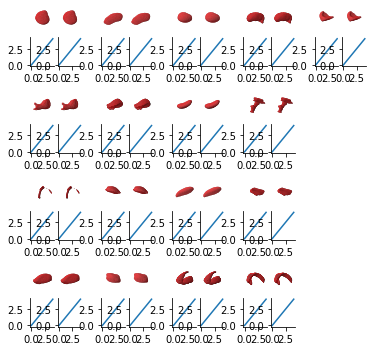

In [252]:
fig = plt.figure(figsize=(16/2.54, 16/2.54)) # 16 x 16 cm should fit on A4 (keeping margins in mind)
gs = matplotlib.gridspec.GridSpec(4*3, # row for meshes, row for scatters, row empty 
                                  5*3, # two cols for meshes/scatters, one col empty 
                                  figure=fig, left=None, bottom=None, right=None, top=None, wspace=None, hspace=None, 
                                  width_ratios=[1,1,0.5] * 5, 
                                  height_ratios=[1,1,0.5] * 4)

for i,mesh in enumerate(all_meshes):
    row = i%4 * 3  # two rows per 'subplot', one empty
    col = np.floor(i/4).astype(int) * 3 # two columns per 'subplot', one empty
    
    # Mesh young
    ax = fig.add_subplot(gs[row, col], projection='3d')
    ax.add_collection3d(deepcopy(mesh['mesh']))
    ax.set_xlim([mesh['ranges'][0][0], mesh['ranges'][1][0]])
    ax.set_ylim([mesh['ranges'][0][1], mesh['ranges'][1][1]])
    ax.set_zlim([mesh['ranges'][0][2], mesh['ranges'][1][2]])
    ax.axis('off')

    ax = fig.add_subplot(gs[row+1,col])
    ax.plot([0,1,2,3,4], [0,1,2,3,4])
    ax = fig.add_subplot(gs[row+1,col+1])
    ax.plot([0,1,2,3,4], [0,1,2,3,4])
    
    # Mesh old [same mesh, different colors]
    ax = fig.add_subplot(gs[row,col+1], projection='3d')
    ax.add_collection3d(deepcopy(mesh['mesh']))
    ax.set_xlim([mesh['ranges'][0][0], mesh['ranges'][1][0]])
    ax.set_ylim([mesh['ranges'][0][1], mesh['ranges'][1][1]])
    ax.set_zlim([mesh['ranges'][0][2], mesh['ranges'][1][2]])
    ax.axis('off')
    sns.despine()

fig.savefig('./tmp.png', bbox_inches='tight')

In [251]:
fig.savefig('./tmp.pdf', bbox_inches='tight')

In [ ]:
fig = plt.figure(figsize=(15, 8))
gs = matplotlib.gridspec.GridSpec(8, 15, figure=fig, left=None, bottom=None, right=None, top=None, wspace=None, hspace=None, width_ratios=None, height_ratios=None)

for i,mesh in enumerate(all_meshes):
    row = i%4 * 2  # two rows per 'subplot'
    col = np.floor(i/4).astype(int) * 3 # three columns per 'subplot'
    
    ax = fig.add_subplot(gs[slice(row, row+2), col], projection='3d')
    ax.add_collection3d(deepcopy(mesh['mesh']))
    ax.set_xlim([mesh['ranges'][0][0], mesh['ranges'][1][0]])
    ax.set_ylim([mesh['ranges'][0][1], mesh['ranges'][1][1]])
    ax.set_zlim([mesh['ranges'][0][2], mesh['ranges'][1][2]])
    ax.axis('off')

    ax = fig.add_subplot(gs[row,col+1])
    ax.plot([0,1,2,3,4], [0,1,2,3,4])
    ax = fig.add_subplot(gs[row+1,col+1])
    ax.plot([0,1,2,3,4], [0,1,2,3,4])
    ax = fig.add_subplot(gs[slice(row, row+2),col+2], projection='3d')
    ax.add_collection3d(deepcopy(mesh['mesh']))
    ax.set_xlim([mesh['ranges'][0][0], mesh['ranges'][1][0]])
    ax.set_ylim([mesh['ranges'][0][1], mesh['ranges'][1][1]])
    ax.set_zlim([mesh['ranges'][0][2], mesh['ranges'][1][2]])
    ax.axis('off')
    sns.despine()

# ax2 = fig.add_subplot(gs[1, :-1])
# ax3 = fig.add_subplot(gs[1:, -1])
# ax4 = fig.add_subplot(gs[-1, 0])
# ax5 = fig.add_subplot(gs[-1, -2])

# for i,mesh in enumerate(all_meshes):
#     ax = fig.add_subplot(4,5,i+1,projection='3d')
#     ax.add_collection3d(deepcopy(mesh['mesh']))
#     ax.set_xlim([mesh['ranges'][0][0], mesh['ranges'][1][0]])
#     ax.set_ylim([mesh['ranges'][0][1], mesh['ranges'][1][1]])
#     ax.set_zlim([mesh['ranges'][0][2], mesh['ranges'][1][2]])
#     ax.set_title(mesh['name'])
    
#    ax.grid(False)
#     ax.set_xticks([])
#     ax.set_yticks([])
#     ax.set_zticks([])
#    ax.set_frame_on(False)
#plt.axis('off')

(3.0, 6.0, 3.0, 6.0)

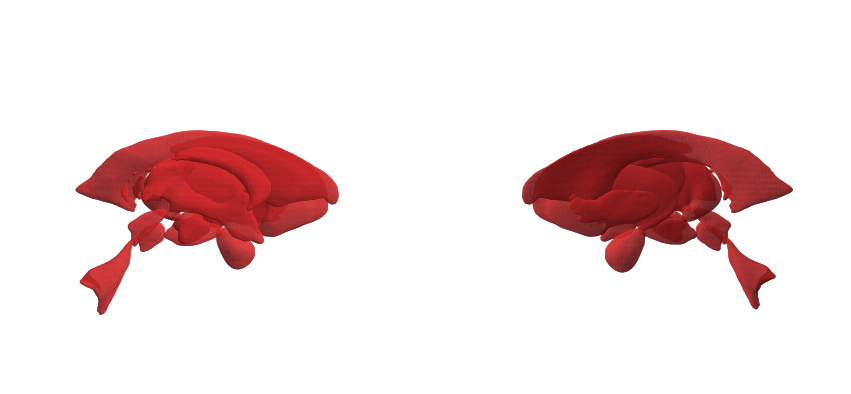

In [207]:
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(1,2,1,projection='3d')
for i,mesh in enumerate(all_meshes):
    ax.add_collection3d(deepcopy(mesh['mesh']))
ax.set_xlim([3,6])
ax.set_ylim([3,6])
ax.set_zlim([1.5,4.5])

ax.view_init(0, 180)
plt.axis('off')

ax = fig.add_subplot(1,2,2,projection='3d')
for i,mesh in enumerate(all_meshes):
    ax.add_collection3d(deepcopy(mesh['mesh']))
ax.set_xlim([3,6])
ax.set_ylim([3,6])
ax.set_zlim([1.5,4.5])

ax.view_init(0, 0)
plt.axis('off')

In [209]:
%matplotlib qt
plt.show()

print('ax.azim {}'.format(ax.azim))
print('ax.elev {}'.format(ax.elev))

ImportError: Cannot load backend 'Qt5Agg' which requires the 'qt5' interactive framework, as 'headless' is currently running

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16


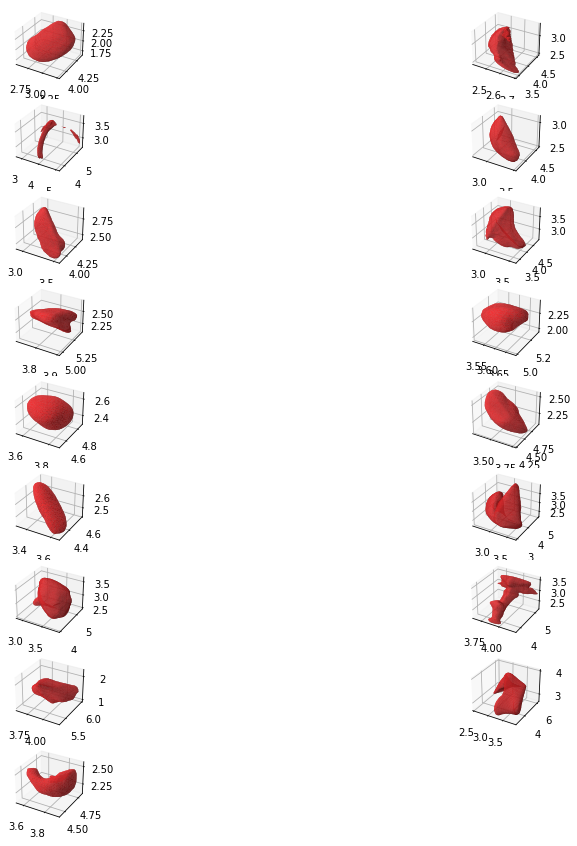

In [176]:
fig = plt.figure(figsize=(15, 15))
    
for i,mesh in enumerate(all_meshes):
    ax = fig.add_subplot(9,2,i+1,projection='3d')
    ax.add_collection3d(deepcopy(mesh['mesh']))
    ax.set_xlim([mesh['ranges'][0][0], mesh['ranges'][1][0]])
    ax.set_ylim([mesh['ranges'][0][1], mesh['ranges'][1][1]])
    ax.set_zlim([mesh['ranges'][0][2], mesh['ranges'][1][2]])

(2.117908172607422, 2.587496032714844)

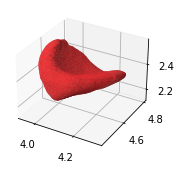

In [172]:
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(2,2,1,projection='3d')
indx = 9
ax.add_collection3d(deepcopy(all_meshes[indx]['mesh']))
ax.set_xlim([all_meshes[indx]['ranges'][0][0], all_meshes[indx]['ranges'][1][0]])
ax.set_ylim([all_meshes[indx]['ranges'][0][1], all_meshes[indx]['ranges'][1][1]])
ax.set_zlim([all_meshes[indx]['ranges'][0][2], all_meshes[indx]['ranges'][1][2]])


(2.117908172607422, 2.587496032714844)

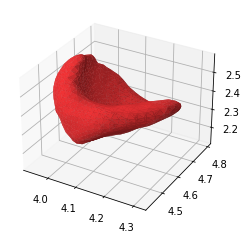

In [139]:
## marching cubes - https://stackoverflow.com/questions/56864378/how-to-light-and-shade-a-poly3dcollection
import numpy as np
from skimage import measure
from scipy.interpolate import griddata
import matplotlib as mpl
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from matplotlib.colors import LightSource

# Generate an grid to inerpolate to
#X, Y, Z = np.meshgrid(0.0:1.0:50j, 0.0:1.0:50j, 0.0:1.0:50j)

# Interpolate (coor and phi are the numerical grid and scalar values)
#F = griddata(coor, phi, (X, Y, Z), method='nearest')

# Make the contour, marching cubes
marchCubeSpace = 1.0 / 50.0
verts, faces, normals, values = measure.marching_cubes(raw_data, 0.5, spacing=(marchCubeSpace, marchCubeSpace, marchCubeSpace))

# Create Ploy3D and set up a light source
mesh = Poly3DCollection(verts[faces], alpha=1.0)
ls = LightSource(azdeg=225.0, altdeg=45.0)

# First change - normals are per vertex, so I made it per face.
normalsarray = np.array([np.array((np.sum(normals[face[:], 0]/3), np.sum(normals[face[:], 1]/3), np.sum(normals[face[:], 2]/3))/np.sqrt(np.sum(normals[face[:], 0]/3)**2 + np.sum(normals[face[:], 1]/3)**2 + np.sum(normals[face[:], 2]/3)**2)) for face in faces])

# Next this is more asthetic, but it prevents the shadows of the image being too dark. (linear interpolation to correct)
min = np.min(ls.shade_normals(normalsarray, fraction=1.0)) # min shade value
max = np.max(ls.shade_normals(normalsarray, fraction=1.0)) # max shade value
diff = max-min
newMin = 0.3
newMax = 0.95
newdiff = newMax-newMin

# Using a constant color, put in desired RGB values here.
colourRGB = np.array((255.0/255.0, 54.0/255.0, 57/255.0, 1.0))

# The correct shading for shadows are now applied. Use the face normals and light orientation to generate a shading value and apply to the RGB colors for each face.
rgbNew = np.array([colourRGB*(newMin + newdiff*((shade-min)/diff)) for shade in ls.shade_normals(normalsarray, fraction=1.0)])

# Apply color to face
mesh.set_facecolor(rgbNew)

# Plot
fig = plt.figure()


ax = fig.add_subplot(8,2,i,projection='3d')
ax.add_collection3d(mesh)
ax.set_xlim([verts.min(0)[0], verts.max(0)[0]])
ax.set_ylim([verts.min(0)[1], verts.max(0)[1]])
ax.set_zlim([verts.min(0)[2], verts.max(0)[2]])


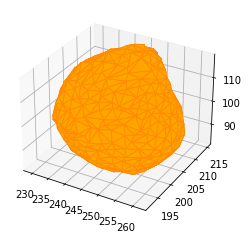

In [92]:

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D, art3d

v = structs['AMG-R']['verts'].T

f = structs['AMG-R']['faces'].T.astype(int)

# round?

v = np.round(v).astype(int)
#f = np.round(f*100).astype(int)


C = np.random.normal(size=f.T.shape[1]) + 10
fig = plt.figure()
ax = fig.add_subplot(projection="3d")


norm = plt.Normalize(C.min(), C.max())
colors = plt.cm.viridis(norm(C))

# ax.add_collection3d(Poly3DCollection(poly3d, edgecolors='k', facecolors='w', linewidths=1, alpha=0.5))

pc = art3d.Poly3DCollection(v[f], facecolors='orange', edgecolor="darkorange")
ax.add_collection(pc)

from matplotlib.colors import LightSource


ax.set_xlim([228, 263])
ax.set_ylim([191, 216])
ax.set_zlim([82, 119])


plt.show()



In [107]:
verts = structs['AMG-R']['verts']
faces = structs['AMG-R']['faces']
normals = structs['AMG-R']['normals']

# round?

verts = np.round(verts).astype(int)
faces = faces.astype(int)
#f = np.round(f*100).astype(int)


#C = np.random.normal(size=f.T.shape[1]) + 10
#fig = plt.figure()
#ax = fig.add_subplot(projection="3d")


#norm = plt.Normalize(C.min(), C.max())
#colors = plt.cm.viridis(norm(C))

# ax.add_collection3d(Poly3DCollection(poly3d, edgecolors='k', facecolors='w', linewidths=1, alpha=0.5))

#pc = art3d.Poly3DCollection(v[f], facecolors='orange', edgecolor="darkorange")
#ax.add_collection(pc)

In [108]:
normals

array([], dtype=float64)

In [100]:
faces

array([[  4,   0,   3],
       [  0,   4,   1],
       [  2,   3,  11],
       ...,
       [436, 442, 434],
       [435, 443, 444],
       [435, 444, 436]])

In [103]:
faces.shape

(886, 3)

In [104]:
normals.shape

(0,)

In [98]:
from matplotlib.colors import LightSource

mesh = Poly3DCollection(verts[faces], alpha=1.0)
ls = LightSource(azdeg=225.0, altdeg=45.0)

# First change - normals are per vertex, so I made it per face.
normalsarray = np.array([np.array((np.sum(normals[face[:], 0]/3), 
                                   np.sum(normals[face[:], 1]/3), 
                                   np.sum(normals[face[:], 2]/3))/np.sqrt(np.sum(normals[face[:], 0]/3)**2 + np.sum(normals[face[:], 1]/3)**2 + np.sum(normals[face[:], 2]/3)**2)) for face in faces])

# Next this is more asthetic, but it prevents the shadows of the image being too dark. (linear interpolation to correct)
min_ = np.min(ls.shade_normals(normalsarray, fraction=1.0)) # min shade value
max_ = np.max(ls.shade_normals(normalsarray, fraction=1.0)) # max shade value
diff = max_-min_
newMin = 0.3
newMax = 0.95
newdiff = newMax-newMin

# Using a constant color, put in desired RGB values here.
colourRGB = np.array((255.0/255.0, 54.0/255.0, 57/255.0, 1.0))

# The correct shading for shadows are now applied. Use the face normals and light orientation to generate a shading value and apply to the RGB colors for each face.
rgbNew = np.array([colourRGB*(newMin + newdiff*((shade-min)/diff)) for shade in ls.shade_normals(normalsarray, fraction=1.0)])

# Apply color to face
mesh.set_facecolor(rgbNew)

# Plot
fig = plt.figure()
ax = fig.add_subplot(0, 0, 0, projection='3d')
ax.add_collection3d(mesh)

IndexError: too many indices for array

In [ ]:
\

In [ ]:
import numpy as np
from skimage import measure
from scipy.interpolate import griddata
import matplotlib as mpl
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from matplotlib.colors import LightSource

# Generate an grid to inerpolate to
X, Y, Z = np.meshgrid(0.0:1.0:50j, 0.0:1.0:50j, 0.0:1.0:50j)

# Interpolate (coor and phi are the numerical grid and scalar values)
F = griddata(coor, phi, (X, Y, Z), method='nearest')

# Make the contour, marching cubes
marchCubeSpace = 1.0 / 50.0
verts, faces, normals, values = measure.marching_cubes_lewiner(F, 0.5, spacing=(marchCubeSpace, marchCubeSpace, marchCubeSpace))

# Create Ploy3D and set up a light source
mesh = Poly3DCollection(verts[faces], alpha=1.0)
ls = LightSource(azdeg=225.0, altdeg=45.0)

# First change - normals are per vertex, so I made it per face.
normalsarray = np.array([np.array((np.sum(normals[face[:], 0]/3), np.sum(normals[face[:], 1]/3), np.sum(normals[face[:], 2]/3))/np.sqrt(np.sum(normals[face[:], 0]/3)**2 + np.sum(normals[face[:], 1]/3)**2 + np.sum(normals[face[:], 2]/3)**2)) for face in faces])

# Next this is more asthetic, but it prevents the shadows of the image being too dark. (linear interpolation to correct)
min = np.min(ls.shade_normals(normalsarray, fraction=1.0)) # min shade value
max = np.max(ls.shade_normals(normalsarray, fraction=1.0)) # max shade value
diff = max-min
newMin = 0.3
newMax = 0.95
newdiff = newMax-newMin

# Using a constant color, put in desired RGB values here.
colourRGB = np.array((255.0/255.0, 54.0/255.0, 57/255.0, 1.0))

# The correct shading for shadows are now applied. Use the face normals and light orientation to generate a shading value and apply to the RGB colors for each face.
rgbNew = np.array([colourRGB*(newMin + newdiff*((shade-min)/diff)) for shade in ls.shade_normals(normalsarray, fraction=1.0)])

# Apply color to face
mesh.set_facecolor(rgbNew)

# Plot
fig = plt.figure()
ax = fig.add_subplot(0, 0, 0, projection='3d')
ax.add_collection3d(mesh)

In [22]:
v

array([[127.758034, 202.676636,  94.671753],
       [127.286263, 204.309052,  96.857925],
       [127.432915, 203.956787,  98.968697],
       ...,
       [163.534119, 208.769577, 107.291946],
       [163.090179, 208.958466, 103.08181 ],
       [162.836456, 210.636063, 105.284019]])

array([[127.758034, 127.286263, 127.432915, ..., 163.534119, 163.090179,
        162.836456],
       [202.676636, 204.309052, 203.956787, ..., 208.769577, 208.958466,
        210.636063],
       [ 94.671753,  96.857925,  98.968697, ..., 107.291946, 103.08181 ,
        105.284019]])

In [ ]:
app/data/ahead_objs/original_meshes/amg-l.obj
app/data/ahead_objs/original_meshes/amg-r.obj
app/data/ahead_objs/original_meshes/cl-l.obj
app/data/ahead_objs/original_meshes/cl-r.obj
app/data/ahead_objs/original_meshes/fx-lr.obj
app/data/ahead_objs/original_meshes/gpe-l.obj
app/data/ahead_objs/original_meshes/gpe-r.obj
app/data/ahead_objs/original_meshes/gpi-l.obj
app/data/ahead_objs/original_meshes/gpi-r.obj
app/data/ahead_objs/original_meshes/ic-l.obj
app/data/ahead_objs/original_meshes/ic-r.obj
app/data/ahead_objs/original_meshes/pag-l.obj
app/data/ahead_objs/original_meshes/pag-r.obj
app/data/ahead_objs/original_meshes/ppn-l.obj
app/data/ahead_objs/original_meshes/ppn-r.obj
app/data/ahead_objs/original_meshes/rn-l.obj
app/data/ahead_objs/original_meshes/rn-r.obj
app/data/ahead_objs/original_meshes/sn-l.obj
app/data/ahead_objs/original_meshes/sn-r.obj
app/data/ahead_objs/original_meshes/stn-l.obj
app/data/ahead_objs/original_meshes/stn-r.obj
app/data/ahead_objs/original_meshes/str-l.obj
app/data/ahead_objs/original_meshes/str-r.obj
app/data/ahead_objs/original_meshes/tha-l.obj
app/data/ahead_objs/original_meshes/tha-r.obj
app/data/ahead_objs/original_meshes/vent-3.obj
app/data/ahead_objs/original_meshes/vent-4.obj
app/data/ahead_objs/original_meshes/vent-l.obj
app/data/ahead_objs/original_meshes/vent-r.obj
app/data/ahead_objs/original_meshes/vta-l.obj
app/data/ahead_objs/original_meshes/vta-r.obj
app/data/ahead_objs/original_meshes/amg-l.obj
app/data/ahead_objs/original_meshes/amg-r.obj
app/data/ahead_objs/original_meshes/cl-l.obj
app/data/ahead_objs/original_meshes/cl-r.obj
app/data/ahead_objs/original_meshes/fx-lr.obj
app/data/ahead_objs/original_meshes/gpe-l.obj
app/data/ahead_objs/original_meshes/gpe-r.obj
app/data/ahead_objs/original_meshes/gpi-l.obj
app/data/ahead_objs/original_meshes/gpi-r.obj
app/data/ahead_objs/original_meshes/ic-l.obj
app/data/ahead_objs/original_meshes/ic-r.obj
app/data/ahead_objs/original_meshes/pag-l.obj
app/data/ahead_objs/original_meshes/pag-r.obj
app/data/ahead_objs/original_meshes/ppn-l.obj
app/data/ahead_objs/original_meshes/ppn-r.obj
app/data/ahead_objs/original_meshes/rn-l.obj
app/data/ahead_objs/original_meshes/rn-r.obj
app/data/ahead_objs/original_meshes/sn-l.obj
app/data/ahead_objs/original_meshes/sn-r.obj
app/data/ahead_objs/original_meshes/stn-l.obj
app/data/ahead_objs/original_meshes/stn-r.obj
app/data/ahead_objs/original_meshes/str-l.obj
app/data/ahead_objs/original_meshes/str-r.obj
app/data/ahead_objs/original_meshes/tha-l.obj
app/data/ahead_objs/original_meshes/tha-r.obj
app/data/ahead_objs/original_meshes/vent-3.obj
app/data/ahead_objs/original_meshes/vent-4.obj
app/data/ahead_objs/original_meshes/vent-l.obj
app/data/ahead_objs/original_meshes/vent-r.obj
app/data/ahead_objs/original_meshes/vta-l.obj
app/data/ahead_objs/original_meshes/vta-r.obj
app/data/ahead_objs/original_meshes/amg-l.obj
app/data/ahead_objs/original_meshes/amg-r.obj
app/data/ahead_objs/original_meshes/cl-l.obj
app/data/ahead_objs/original_meshes/cl-r.obj
app/data/ahead_objs/original_meshes/fx-lr.obj
app/data/ahead_objs/original_meshes/gpe-l.obj
app/data/ahead_objs/original_meshes/gpe-r.obj
app/data/ahead_objs/original_meshes/gpi-l.obj
app/data/ahead_objs/original_meshes/gpi-r.obj
app/data/ahead_objs/original_meshes/ic-l.obj
app/data/ahead_objs/original_meshes/ic-r.obj
app/data/ahead_objs/original_meshes/pag-l.obj
app/data/ahead_objs/original_meshes/pag-r.obj
app/data/ahead_objs/original_meshes/ppn-l.obj
app/data/ahead_objs/original_meshes/ppn-r.obj
app/data/ahead_objs/original_meshes/rn-l.obj
app/data/ahead_objs/original_meshes/rn-r.obj
app/data/ahead_objs/original_meshes/sn-l.obj
app/data/ahead_objs/original_meshes/sn-r.obj
app/data/ahead_objs/original_meshes/stn-l.obj
app/data/ahead_objs/original_meshes/stn-r.obj
app/data/ahead_objs/original_meshes/str-l.obj
app/data/ahead_objs/original_meshes/str-r.obj
app/data/ahead_objs/original_meshes/tha-l.obj
app/data/ahead_objs/original_meshes/tha-r.obj
app/data/ahead_objs/original_meshes/vent-3.obj
app/data/ahead_objs/original_meshes/vent-4.obj
app/data/ahead_objs/original_meshes/vent-l.obj
app/data/ahead_objs/original_meshes/vent-r.obj
app/data/ahead_objs/original_meshes/vta-l.obj
app/data/ahead_objs/original_meshes/vta-r.obj